In [ ]:
# Yarden Dahan, 208730523

In [ ]:
!pip install wcmatch
!pip install torch_optimizer

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 40 kB 5.0 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 61 kB 300 kB/s 


# Imports

In [ ]:
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"
import gc
import cv2
import dlib
import torch
import random
import requests
import numpy as np
import pandas as pd
import seaborn as sns
import torch.nn as nn
# from wcmatch import glob
from tqdm.auto import tqdm
from torch.optim import SGD
from torch.optim import Adam
from google.colab import drive
import matplotlib.pyplot as plt
# from torch_optimizer import RAdam
import torchvision.models as models
from sklearn.metrics import confusion_matrix
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split
from albumentations import (
    Blur, MotionBlur, MedianBlur, 
    Rotate, RandomRotate90, Flip, VerticalFlip, HorizontalFlip, 
    GaussNoise, IAASharpen, RandomBrightnessContrast, CLAHE,
    OneOf, Compose, ShiftScaleRotate, HueSaturationValue, RandomGamma
)
import torchvision.models as models
from sklearn.metrics import f1_score
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_curve, roc_auc_score

In [ ]:
print("""
               ...   <hello!>
             ."o o".
   oo        "  O  "
 w"()"w      "-===-"
W -==- W      "..."
 "wwww"      ."   ".
w"    "w     "     "
     Elmo & Grover
""")


               ...   <hello!>
             ."o o".
   oo        "  O  "
 w"()"w      "-===-"
W -==- W      "..."
 "wwww"      ."   ".
w"    "w     "     "
     Elmo & Grover



# Cuda & GPU


In [ ]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cpu = torch.device("cpu")
print(f'torch device: {DEVICE}')

torch device: cuda


<a name="Face-Detector"></a>
# Face Detector
[src](https://pyimagesearch.com/2018/09/24/opencv-face-recognition/)

In [ ]:
!wget https://github.com/thegopieffect/computer_vision/raw/master/CAFFE_DNN/res10_300x300_ssd_iter_140000.caffemodel
!wget https://raw.githubusercontent.com/thegopieffect/computer_vision/master/CAFFE_DNN/deploy.prototxt.txt

--2022-05-31 10:28:35--  https://github.com/thegopieffect/computer_vision/raw/master/CAFFE_DNN/res10_300x300_ssd_iter_140000.caffemodel
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/gopinath-balu/computer_vision/raw/master/CAFFE_DNN/res10_300x300_ssd_iter_140000.caffemodel [following]
--2022-05-31 10:28:36--  https://github.com/gopinath-balu/computer_vision/raw/master/CAFFE_DNN/res10_300x300_ssd_iter_140000.caffemodel
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/gopinath-balu/computer_vision/master/CAFFE_DNN/res10_300x300_ssd_iter_140000.caffemodel [following]
--2022-05-31 10:28:36--  https://raw.githubusercontent.com/gopinath-balu/computer_vision/master/CAFFE_DNN/res10_300x300_ssd_iter_140000.caffemodel
Resolving raw.githubuserc

In [ ]:
protoPath = "deploy.prototxt.txt"
modelPath = "res10_300x300_ssd_iter_140000.caffemodel"
detector = cv2.dnn.readNetFromCaffe(protoPath, modelPath)
def get_face(image):
  '''
      get the main face from the image or zeros if there is no face on the image
      this is the origin: https://www.pyimagesearch.com/2018/09/24/opencv-face-recognition
  '''
  # detection variables
  requested_image_size = 224
  requested_confidence = 0.1

  # prep image
  image = cv2.resize(image, (requested_image_size, requested_image_size))
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  # return zeros if no face detected
  face = np.zeros_like(image)

  # detect faces
  blob = cv2.dnn.blobFromImage(image, 1.0, (requested_image_size, requested_image_size))
  detector.setInput(blob)
  detections = detector.forward()

  # get the highest confidece face from detected faces
  if len(detections) > 0:
      i = np.argmax(detections[0, 0, :, 2])
      confidence = detections[0, 0, i, 2]
      if confidence > requested_confidence:
          box = (detections[0, 0, i, 3:7] * requested_image_size).astype("int")
          box[box < 0] = 0
          (s_x, s_y, e_x, e_y) = box
          face = image[s_y:e_y, s_x:e_x]
          face = cv2.resize(face, (requested_image_size, requested_image_size))
      else:
          print(f'confidence level is: {confidence} < 0.1')
  else:
      print(f'there is no face detected')
  return face

<a name="LoadData"></a>
# Load Data
* taken from: https://colab.research.google.com/drive/1fUoSEdtTqbhwh8htXdOnWQLp8FVSowO4?usp=sharing  
By me (Yarden Dahan).

* addition: data split to 3 groups- train, validation, test.

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
#images = 260
/content/gdrive/My Drive/Afeka_FaceData2022/Lionel Messi/2.jpg
total.length=260
train.length = 208
test.length= 52

total.length=260
train.length = 145
validation.length= 63
test.length= 52


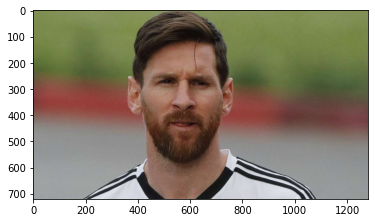

In [ ]:
# access to drive shared folder
drive.mount('/content/gdrive')
images_dir="/content/gdrive/My Drive/Afeka_FaceData2022"
# all folders contained on main folder on the drive
all_paths = [ f.path for f in os.scandir(images_dir) if f.is_dir() ]
# arrange paths for th files
images_paths=[]
images_paths_student=[]
for path in all_paths:
  images_paths_student.append([ f.path for f in os.scandir(path) ])
for file in images_paths_student:
  images_paths+=(file)

# create labels & their encode
images_map={}
for i in range(len(all_paths)):
  images_map[all_paths[i].split("/")[-1]]=i

print(f"#images = {len(images_paths)}\n{images_paths[100]}")
plt.imshow(plt.imread(images_paths[100]))

data = pd.DataFrame(columns=['image','label','name'])


def load_data(paths=images_paths,label_map = images_map, test_size=0.2):
  test_size = test_size
  for i in range(len(paths)):
    image = plt.imread(paths[i])
    image = cv2.resize(image, (512, 512), interpolation=cv2.INTER_AREA)

    name = paths[i].split("/")[-2]
    label = images_map[name]
    data.loc[i] = [image,label,name]

  x_train, x_test, y_train, y_test = train_test_split(data['image'], data['label'],test_size=test_size)
  return ((x_train.reset_index().drop("index", axis=1), y_train.reset_index().drop("index", axis=1)), 
  (x_test.reset_index().drop("index", axis=1), y_test.reset_index().drop("index", axis=1)))  

(x_train, y_train), (x_test, y_test) = load_data()
print(f'total.length={len(data)}\ntrain.length = {len(x_train)}\ntest.length= {len(x_test)}\n')
# data.head()

x_train, x_valid,y_train,y_valid = train_test_split(x_train, y_train,test_size=0.3)
(x_train, y_train),(x_valid,y_valid) = ((x_train.reset_index().drop("index", axis=1), y_train.reset_index().drop("index", axis=1)), 
                                        (x_valid.reset_index().drop("index", axis=1), y_valid.reset_index().drop("index", axis=1)))  
print(f'total.length={len(data)}\ntrain.length = {len(x_train)}\nvalidation.length= {len(x_valid)}\ntest.length= {len(x_test)}')

<a name="dataset"></a>
# Dataset class


In [ ]:
class MyDataset(Dataset):
  def __init__(self,data,target = None, transforms=None, train= True, test=False,label_map = images_map):
    self.data = data
    self.label_map = label_map
    if not test:
      self.target = target
    self.transforms= transforms
    self.train=train
    self.test=test

  def __len__(self):
    return len(self.data)

  def __getitem__(self, idx):
    image = self.data.loc[idx]["image"]
    image = get_face(image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = np.asarray(image)
    image = image.astype(np.uint8)
    if self.train:
      if self.transforms:
        image = self.transforms(image=image, label='label')['image']

    # image = np.float32(image)
    # image = torch.from_numpy(image)
    if self.test:
      return image 
    else:
      label = self.target.loc[idx]["label"]
      name = get_key(self.label_map,label)
      
      return image,name,label


# Show Images

In [ ]:
# function to return key for any value
def get_key(my_dict,val):
  for k,v in images_map.items():
    if val == v:
      return k
  return "key doesn't exist"

def show_images(num_classes,data = data,rows = 4, cols = 4):
  fig = plt.figure(figsize=(cols*5, rows*5), dpi=80)

  for i in range(num_classes):
    row = data.loc[data['label'] == i].reset_index().loc[0]
    image = row['image']
    label = row['label']
    name = row['name']
    
    fig.add_subplot(rows, cols, i+1)
    plt.title(name)
    plt.axis("off")
    plt.imshow(image)        

    if len(image) != 3:
      plt.imshow(image, cmap=plt.cm.gray)
    else:
      plt.imshow(image)        
  plt.show()
def show_images_transforms(images_list,tag_list,cols,rows):
  plt.figure(figsize=[cols*5, rows*5])

  for i in range(len(images_list)):
    image = images_list[i]
    
    plt.subplot(rows, cols, i+1)
    plt.title(tag_list[i])
    plt.axis("off")
    if len(image) != 3:
        plt.imshow(image, cmap=plt.cm.gray)
    else:
      plt.imshow(image)        
  plt.show()



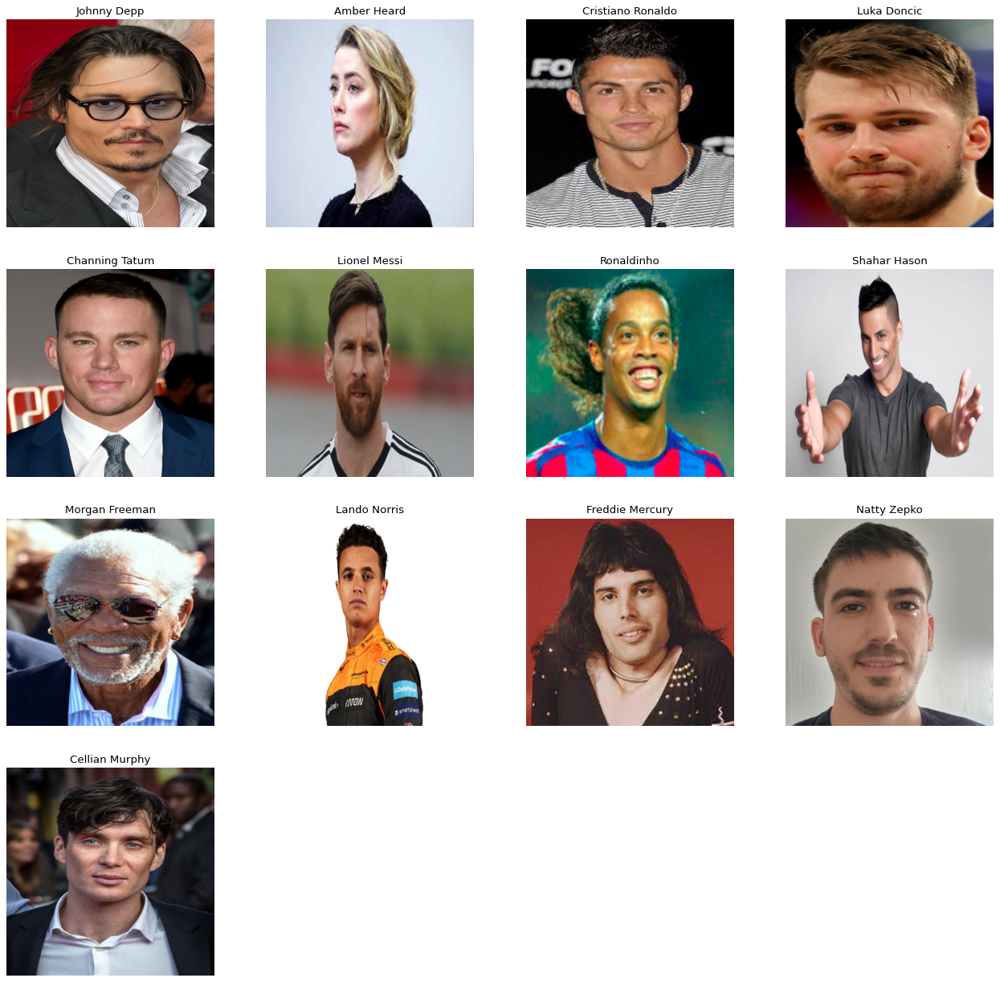

In [ ]:
num_classes = len(images_map)
show_images(num_classes,rows = 6, cols = 4)

# Transforms & DataLoaders

In [ ]:
train_transform= Compose([
    OneOf([
          Blur(blur_limit=3, p=0.5), 
          MotionBlur(blur_limit=3, p=0.5),
          MedianBlur(blur_limit=3, p=0.5)]),

          GaussNoise(var_limit=(0,10.0), p=0.5), 
          IAASharpen(alpha=(0.2, 0.5), lightness=(0.5, 1.0), p=0.5),
          CLAHE(clip_limit=5, p=0.5),
          RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=0.5),
          RandomGamma(gamma_limit=(90, 120), p=0.5),
          HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=30, p=0.5),

          OneOf([
                HorizontalFlip(p=1),Rotate(limit=30, border_mode=cv2.BORDER_CONSTANT, p=1),  
                ShiftScaleRotate(rotate_limit=15, border_mode=cv2.BORDER_CONSTANT, p=1)]),
])

BS=16
trainset=MyDataset(data = x_train,target = y_train ,transforms=train_transform, train=True,label_map=images_map)
train_loader= DataLoader(trainset,batch_size=BS,shuffle=True, num_workers=2)#, pin_memory=True)

validset=MyDataset(data = x_valid,target = y_valid ,transforms=train_transform, train=True,label_map=images_map)
valid_loader= DataLoader(validset,batch_size=BS,shuffle=True, num_workers=2)#, pin_memory=True)

testset=MyDataset(data = x_test, train=False, test=True)
test_loader= DataLoader(testset,batch_size=BS,shuffle=False, num_workers=2)#, pin_memory=True)

<a name="transforms"></a>

## Show Transforms

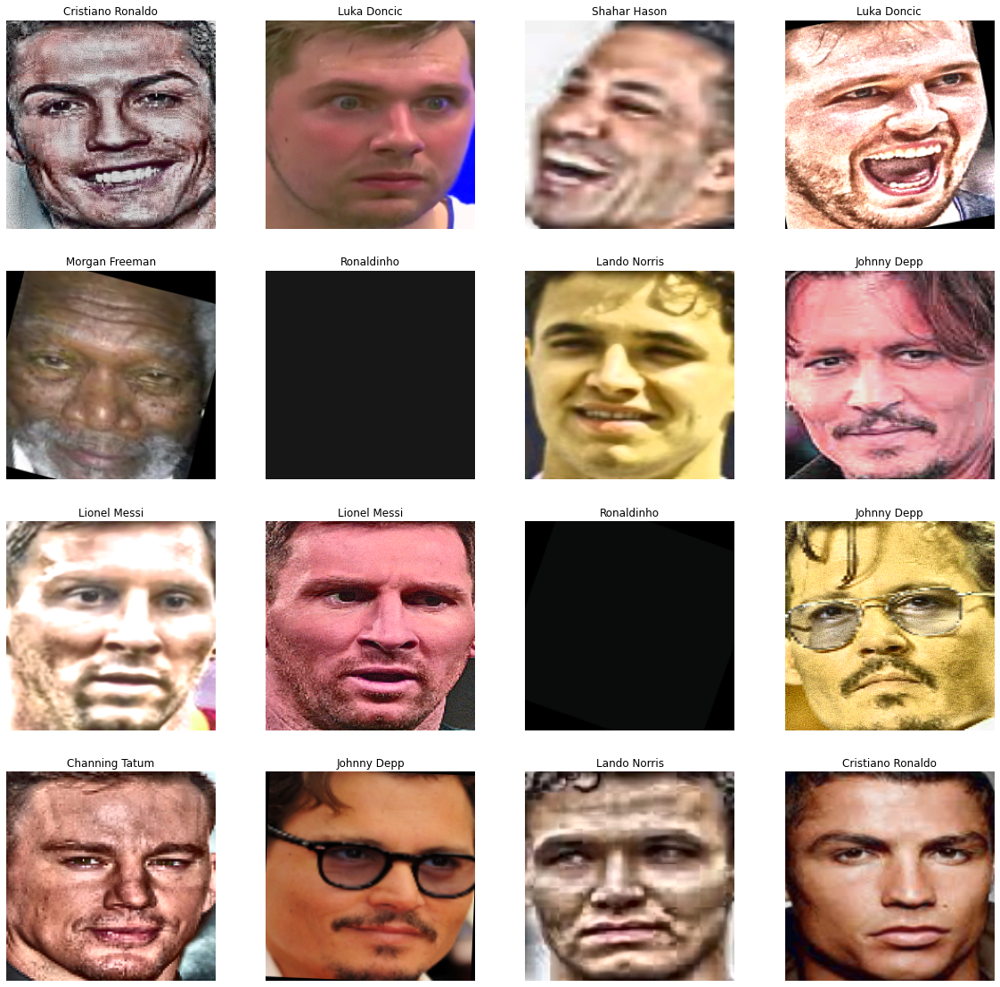

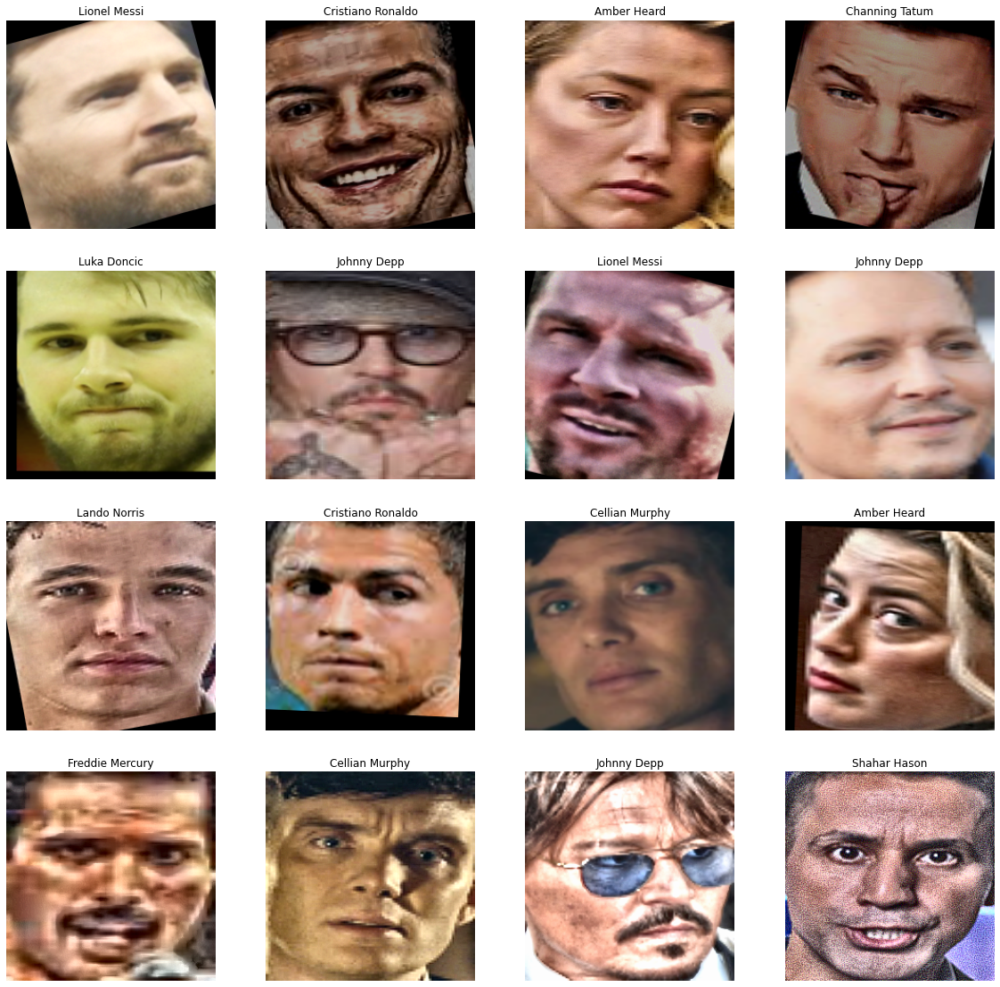

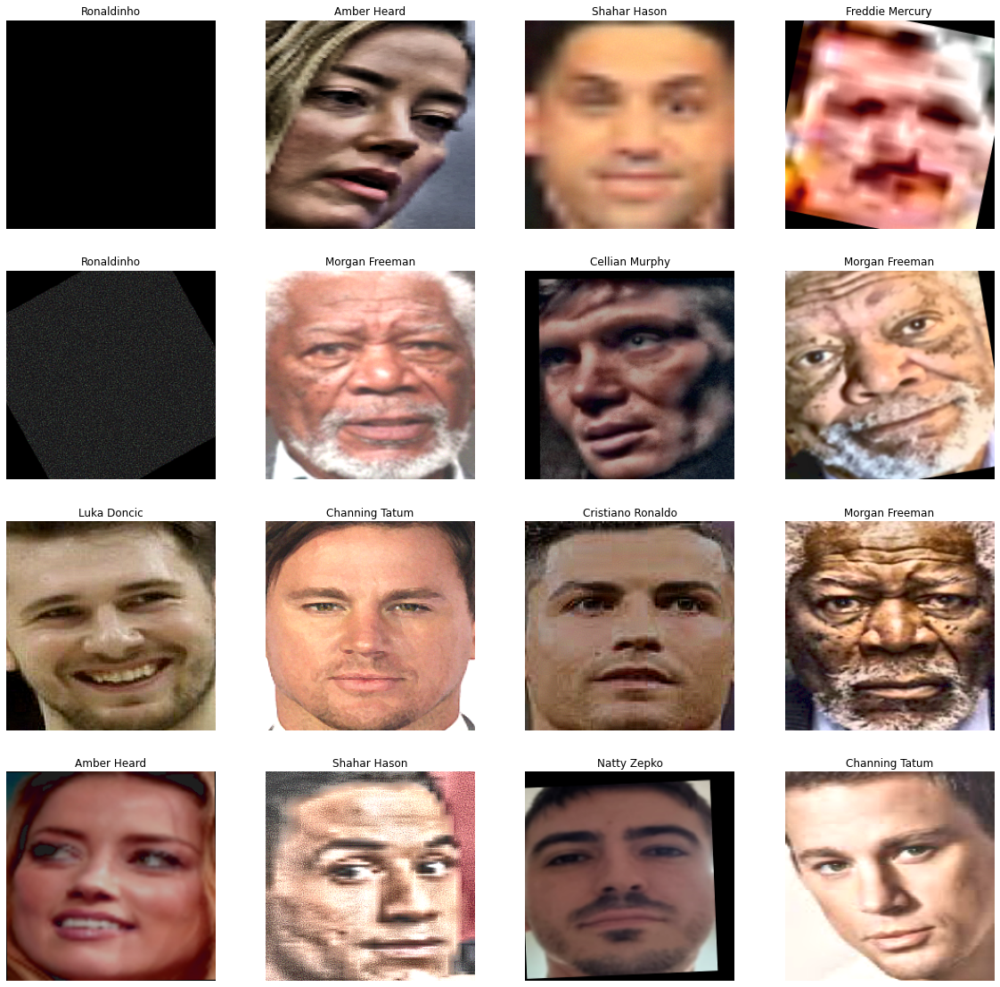

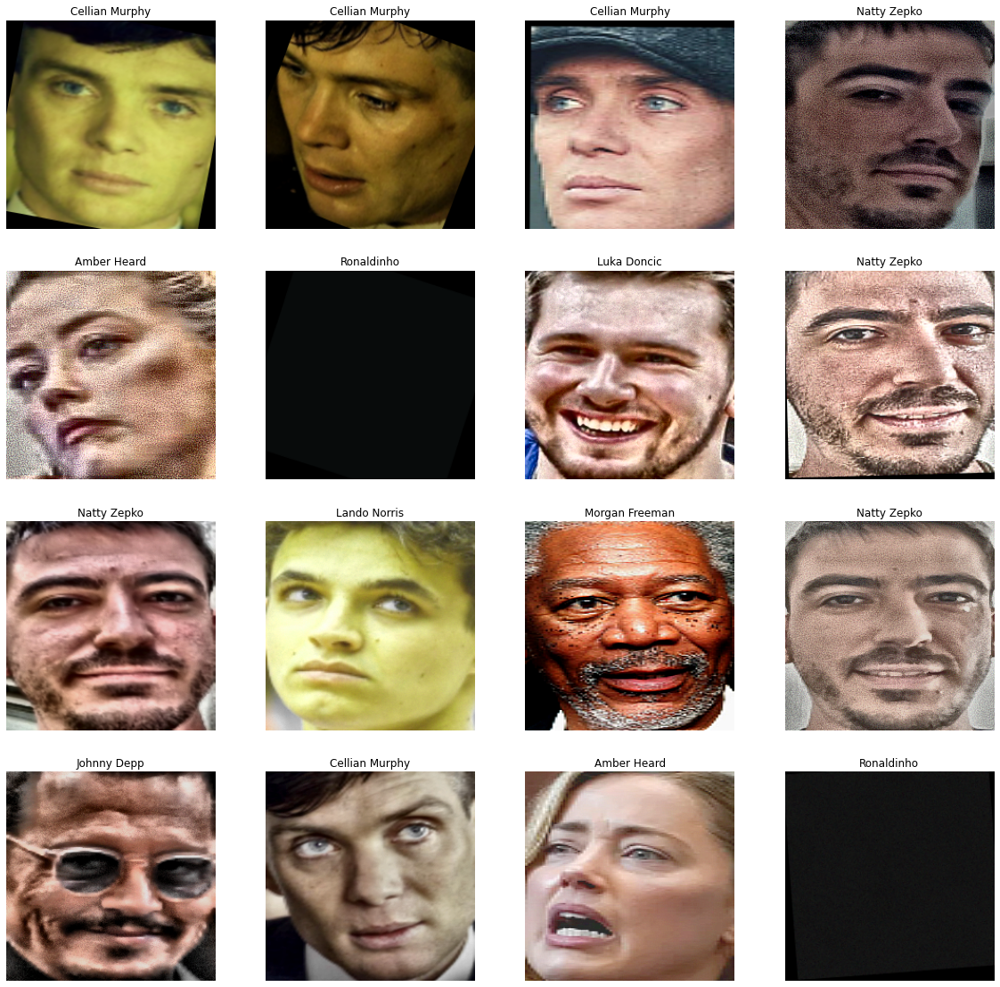

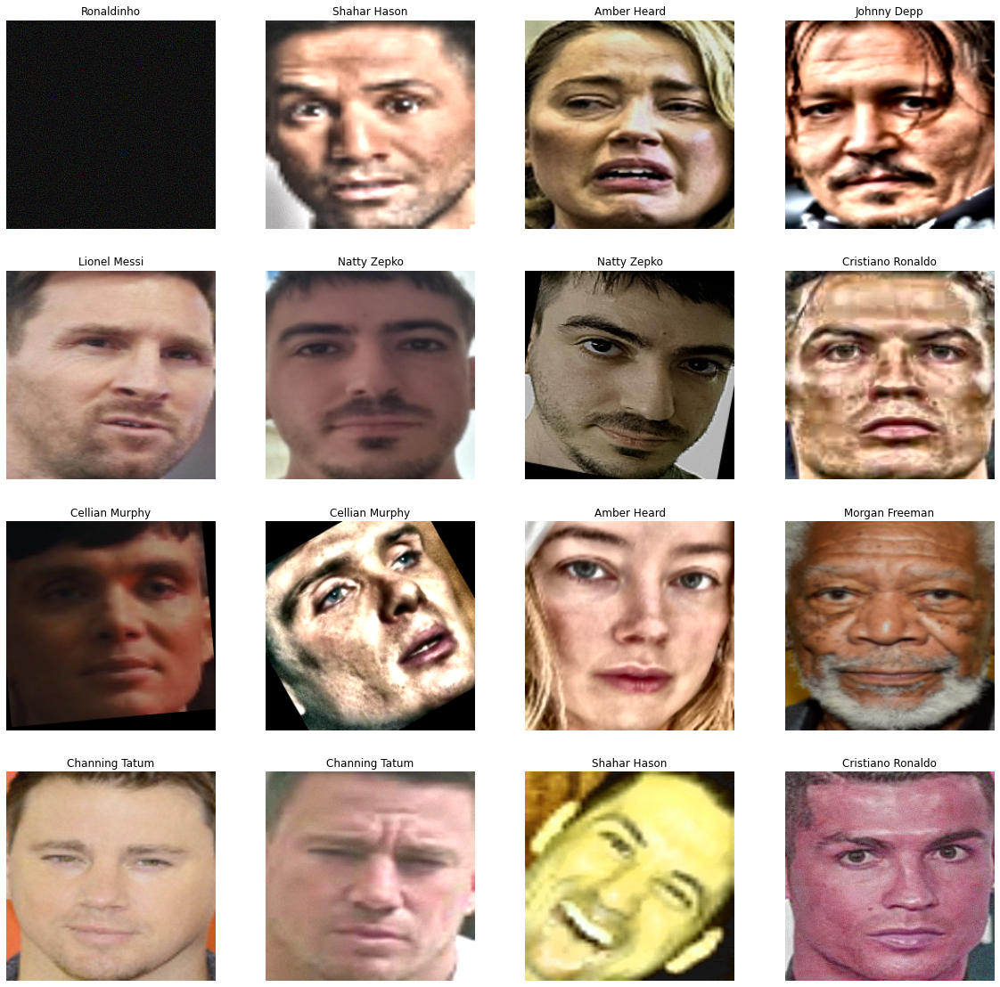

In [ ]:
for i, (images, names, labels) in enumerate(train_loader):
  if i < 5 :
    np_images = images.numpy()
    show_images_transforms(np_images, names,4, 5)
  else:
    break

<a name="VGG16"></a>
# VGG16 Architecture
<img src="https://miro.medium.com/max/940/1*3-TqqkRQ4rWLOMX-gvkYwA.png">

In [ ]:
class VGG16(nn.Module):
  def __init__(self, in_feature_size, out_feature_size):
    super(VGG16, self).__init__()
    self.c1 = nn.Conv2d(in_feature_size, 64, 3, padding=1, bias=True)
    self.c2 = nn.Conv2d(64, 64, 3, padding=1, bias=True)
    self.s3 = nn.MaxPool2d(2)
    self.c4 = nn.Conv2d(64, 128, 3, padding=1, bias=True)
    self.c5 = nn.Conv2d(128, 128, 3, padding=1, bias=True)
    self.s6 = nn.MaxPool2d(2)
    self.c7 = nn.Conv2d(128, 256, 3, padding=1, bias=True)
    self.c8 = nn.Conv2d(256, 256, 3, padding=1, bias=True)
    self.c9 = nn.Conv2d(256, 256, 3, padding=1, bias=True)
    self.s10 = nn.MaxPool2d(2)
    self.c11 = nn.Conv2d(256, 512, 3, padding=1, bias=True)
    self.c12 = nn.Conv2d(512, 512, 3, padding=1, bias=True)
    self.c13 = nn.Conv2d(512, 512, 3, padding=1, bias=True)
    self.s14 = nn.MaxPool2d(2)
    self.c15 = nn.Conv2d(512, 512, 3, padding=1, bias=True)
    self.c16 = nn.Conv2d(512, 512, 3, padding=1, bias=True)
    self.c17 = nn.Conv2d(512, 512, 3, padding=1, bias=True)
    self.s18 = nn.MaxPool2d(2)
    self.f19 = nn.Linear(512*7*7, 4096, bias=True)
    self.f20 = nn.Linear(4096, 4096, bias=True)
    self.f21 = nn.Linear(4096, out_feature_size, bias=True)

  def forward(self, x):
    out = torch.relu(self.c2(self.c1(x)))
    out = self.s3(out)
    out = torch.relu(self.c5(self.c4(out)))
    out = self.s6(out)
    out = torch.relu(self.c9(self.c8(self.c7(out))))
    out = self.s10(out)
    out = torch.relu(self.c13(self.c12(self.c11(out))))
    out = self.s14(out)
    out = torch.relu(self.c17(self.c16(self.c15(out))))
    out = self.s18(out)
    out = out.reshape(out.size(0), -1)
    out = torch.relu(self.f19(out))
    out = torch.relu(self.f20(out))
    out = self.f21(out)
    return out

# init VGG
vgg16_model = VGG16(in_feature_size=3,out_feature_size=27)
# pass to device
vgg16_model.to(DEVICE)

VGG16(
  (c1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (c2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (s3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (c4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (c5): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (s6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (c7): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (c8): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (c9): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (s10): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (c11): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (c12): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (c13): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), pa

<a name="modelClass"></a>

# Model parameters

In [ ]:
class FocalLoss(nn.Module):
  def __init__(self, alpha=0.25, gamma=2.0):
    super(FocalLoss, self).__init__()
    self.gamma = gamma
    self.alpha = alpha
    self.cross_entropy_loss = nn.CrossEntropyLoss()

  def forward(self, inputs, targets):
    bce = self.cross_entropy_loss(inputs, targets)
    pt = torch.exp(-bce)
    loss = bce * self.alpha * (torch.pow((1 - pt), self.gamma))
    return loss

# in general alpha should be decreasing and gamma should be increasing.
class Model(nn.Module):
  def __init__(self, model_name, model, pretrained = True, num_classes = 3):
    super().__init__()
    self.model_name = model_name
    self.cnn = model
    # if not VGG:
    #   self.cnn = timm.create_model(self.model_name, pretrained = pretrained, num_classes = num_classes)
    # else:
    #   self.cnn = VGG

  def forward(self, x):
    x = self.cnn(x)
    return x

  def train_mode(self):
    self.best_loss = np.inf
    self.best_epoch = 0
    self.best_acc = 0
    self.train_loss_history = []
    self.train_acc_history = []
      
  def valid_mode(self):
    self.valid_loss_history = []
    self.valid_acc_history = []

<a name="trainAPI"></a>

# Train API

In [ ]:
OUTPUT_PATH = '/.'
# train step
def train_step(train_loader, model, criterion, optimizer):
  # switch to train mode
  model.train()   
  size = len(train_loader.dataset)
  num_batches = len(train_loader)
  loss, correct = 0, 0
  ################################# train #################################
  for batch, (x_train, y_name, y_train) in enumerate(train_loader):
    x_train = x_train.permute(0, 3, 1, 2).float() 
    x_train, y_train = x_train.to(DEVICE), y_train.to(DEVICE)  
    # compute predictions and loss
    optimizer.zero_grad()
    pred = model(x_train)
    loss = criterion(pred, y_train)
    current = batch * len(x_train)
    # Backpropagation: only in train function, not done in validation function
    loss.backward()
    optimizer.step()
    # sum correct predictions
    y_pred, y_true = torch.argmax(pred, axis=1), y_train
    correct += (y_pred == y_true).type(torch.float).sum().item()
    # log
    loss, current = np.round(loss.item(), 5), batch * len(x_train)
  # metrics: calculate accuracy and loss for epoch (all batches)
  correct /= size # epoch accuracy
  loss /= num_batches # epoch loss
  print(f"Train: Accuracy: {(100*correct):>0.2f}%, Avg loss: {loss:>5f} \n")
  model.train_loss_history.append(loss)
  model.train_acc_history.append(correct)
  return loss, correct  

#validation step
def eval_step(valid_loader,model,criterion):
  ################################# validation #################################
  model.eval()
  correct = 0
  size = len(valid_loader.dataset)
  num_batches = len(valid_loader)
  with torch.no_grad(): # disable gradients
      for batch, (x_val, y_name, y_val) in tqdm(enumerate(valid_loader)):
        x_val = x_val.permute(0, 3, 1, 2).float() 
        x_val,y_val = x_val.to(DEVICE),y_val.to(DEVICE)
        # y_val = y_val.to(device)
        # compute predictions and loss
        pred = model(x_val)
        loss_res = criterion(pred, y_val) 
        current = batch * len(x_val)
        # sum correct predictions
        y_pred, y_true = torch.argmax(pred, axis=1), y_val
        correct += (y_pred == y_true).type(torch.float).sum().item()

        loss_res = np.round(loss_res.item(), 5)
  # metrics: calculate accuracy and loss for epoch (all batches)
  correct /= size # epoch accuracy
  loss_res /= num_batches # epoch loss
  model.valid_loss_history.append(loss_res)
  model.valid_acc_history.append(correct)
  print(f"Valid: Accuracy: {(100*correct):>0.2f}%, Avg loss: {loss_res:>5f} \n")
  return loss_res, correct

# Train method
def train(num_epochs,model):
  trace_df = pd.DataFrame(columns=['step', 'train_loss', 'eval_loss', 'train_acc', 'eval_acc'])
  # Create optimizer & loss
  model.optimizer = Adam(model.parameters(),lr=1e-4)
  loss_func = FocalLoss()
  print('\n ******************************* Model : ', model.model_name, " ******************************* \nStarting Training...\n")
  # init  model's state dict
  model.train_mode()
  model.valid_mode()
  for epoch  in tqdm(range(num_epochs)):
    print(f"\n-------------------------------   Epoch {epoch + 1}   -------------------------------\n")
    # train
    train_step(train_loader, model, loss_func, model.optimizer)
    # validation
    valid_loss, valid_acc = eval_step(valid_loader, model, loss_func)
    # save validation loss if it was improved (reduced) & validation accuracy if it was improved (increased)
    if valid_loss < model.best_loss and valid_acc > model.best_acc:
      model.best_epoch = epoch + 1
      model.best_loss = valid_loss
      model.best_acc = valid_acc
      # save the model's weights and biases   
      torch.save(model.state_dict(), OUTPUT_PATH + f"{model.model_name}_ep{model.best_epoch}.pth")        
      torch.save(model.state_dict(), OUTPUT_PATH + f"{model.model_name}_ep{model.best_epoch}.pth")

  print("Done!")


# Train & Architectures

* ImageNet classification
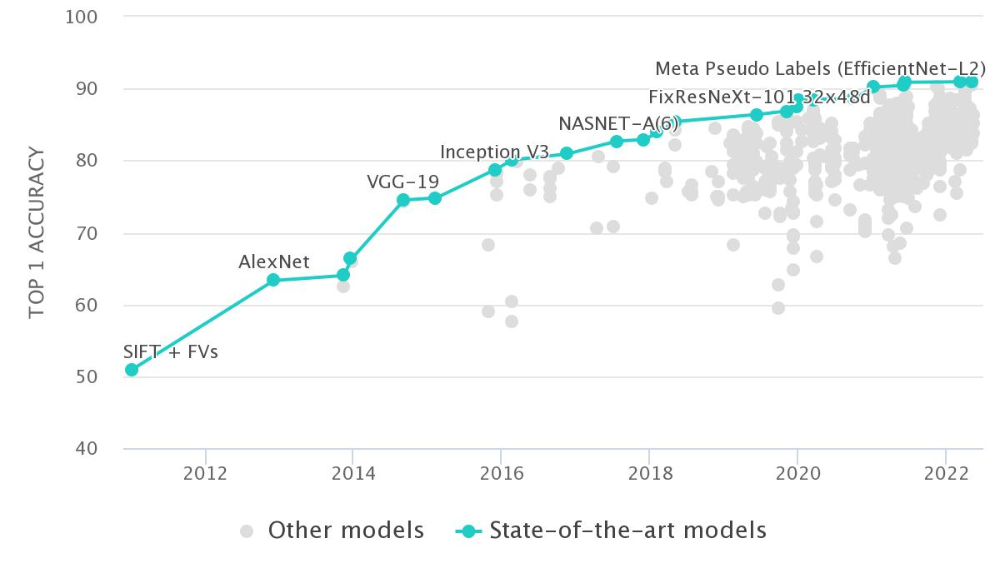

## VGG16 
* ImageNet is an image classification and localization competition. VGG16 is a 16-layer network architecture and weights trained on the competition dataset by the Visual Geometry Group (VGG).
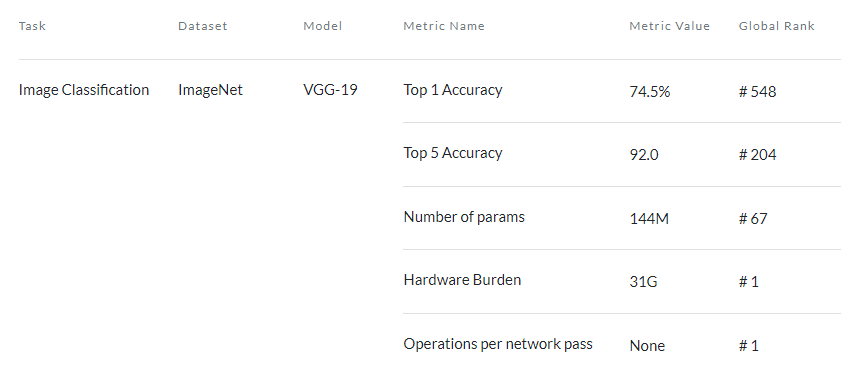

In [ ]:
vgg16_model = Model("VGG16",model=vgg16_model, num_classes = len(images_map))
train(30,vgg16_model)


 ******************************* Model :  VGG16  ******************************* 
Starting Training...



  0%|          | 0/30 [00:00<?, ?it/s]


-------------------------------   Epoch 1   -------------------------------

Train: Accuracy: 9.66%, Avg loss: 0.066757 



0it [00:00, ?it/s]

Valid: Accuracy: 11.11%, Avg loss: 0.174845 


-------------------------------   Epoch 2   -------------------------------

Train: Accuracy: 8.97%, Avg loss: 0.065371 



0it [00:00, ?it/s]

Valid: Accuracy: 11.11%, Avg loss: 0.153220 


-------------------------------   Epoch 3   -------------------------------

Train: Accuracy: 14.48%, Avg loss: 0.041088 



0it [00:00, ?it/s]

Valid: Accuracy: 12.70%, Avg loss: 0.109418 


-------------------------------   Epoch 4   -------------------------------

Train: Accuracy: 12.41%, Avg loss: 0.054526 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.150395 


-------------------------------   Epoch 5   -------------------------------

Train: Accuracy: 13.10%, Avg loss: 0.075382 



0it [00:00, ?it/s]

Valid: Accuracy: 12.70%, Avg loss: 0.156205 


-------------------------------   Epoch 6   -------------------------------

Train: Accuracy: 12.41%, Avg loss: 0.051198 



0it [00:00, ?it/s]

Valid: Accuracy: 6.35%, Avg loss: 0.133430 


-------------------------------   Epoch 7   -------------------------------

Train: Accuracy: 8.28%, Avg loss: 0.039059 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 11.055240 


-------------------------------   Epoch 8   -------------------------------

Train: Accuracy: 8.28%, Avg loss: 0.055396 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.145865 


-------------------------------   Epoch 9   -------------------------------

Train: Accuracy: 7.59%, Avg loss: 0.053515 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.156415 


-------------------------------   Epoch 10   -------------------------------

Train: Accuracy: 5.52%, Avg loss: 0.047139 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.166742 


-------------------------------   Epoch 11   -------------------------------

Train: Accuracy: 9.66%, Avg loss: 0.060030 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.151900 


-------------------------------   Epoch 12   -------------------------------

Train: Accuracy: 7.59%, Avg loss: 0.047214 



0it [00:00, ?it/s]

Valid: Accuracy: 9.52%, Avg loss: 0.139590 


-------------------------------   Epoch 13   -------------------------------

Train: Accuracy: 8.28%, Avg loss: 0.055565 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.149693 


-------------------------------   Epoch 14   -------------------------------

Train: Accuracy: 8.97%, Avg loss: 0.051508 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.160045 


-------------------------------   Epoch 15   -------------------------------

Train: Accuracy: 8.28%, Avg loss: 0.050815 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.161357 


-------------------------------   Epoch 16   -------------------------------

Train: Accuracy: 7.59%, Avg loss: 0.051942 



0it [00:00, ?it/s]

Valid: Accuracy: 3.17%, Avg loss: 0.147758 


-------------------------------   Epoch 17   -------------------------------

Train: Accuracy: 8.28%, Avg loss: 0.059997 



0it [00:00, ?it/s]

Valid: Accuracy: 12.70%, Avg loss: 0.148480 


-------------------------------   Epoch 18   -------------------------------

Train: Accuracy: 11.72%, Avg loss: 0.052359 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.164827 


-------------------------------   Epoch 19   -------------------------------

Train: Accuracy: 10.34%, Avg loss: 0.054587 



0it [00:00, ?it/s]

Valid: Accuracy: 11.11%, Avg loss: 0.149108 


-------------------------------   Epoch 20   -------------------------------

Train: Accuracy: 12.41%, Avg loss: 0.086368 



0it [00:00, ?it/s]

Valid: Accuracy: 9.52%, Avg loss: 0.139530 


-------------------------------   Epoch 21   -------------------------------

Train: Accuracy: 16.55%, Avg loss: 0.054357 



0it [00:00, ?it/s]

Valid: Accuracy: 9.52%, Avg loss: 0.146200 


-------------------------------   Epoch 22   -------------------------------

Train: Accuracy: 17.24%, Avg loss: 0.058330 



0it [00:00, ?it/s]

Valid: Accuracy: 14.29%, Avg loss: 0.127640 


-------------------------------   Epoch 23   -------------------------------

Train: Accuracy: 17.93%, Avg loss: 0.045469 



0it [00:00, ?it/s]

Valid: Accuracy: 11.11%, Avg loss: 0.137750 


-------------------------------   Epoch 24   -------------------------------

Train: Accuracy: 19.31%, Avg loss: 0.029345 



0it [00:00, ?it/s]

Valid: Accuracy: 12.70%, Avg loss: 0.155262 


-------------------------------   Epoch 25   -------------------------------

Train: Accuracy: 19.31%, Avg loss: 0.052760 



0it [00:00, ?it/s]

Valid: Accuracy: 14.29%, Avg loss: 0.116797 


-------------------------------   Epoch 26   -------------------------------

Train: Accuracy: 17.24%, Avg loss: 0.055995 



0it [00:00, ?it/s]

Valid: Accuracy: 14.29%, Avg loss: 0.143047 


-------------------------------   Epoch 27   -------------------------------

Train: Accuracy: 18.62%, Avg loss: 0.050357 



0it [00:00, ?it/s]

Valid: Accuracy: 11.11%, Avg loss: 0.144675 


-------------------------------   Epoch 28   -------------------------------

Train: Accuracy: 17.93%, Avg loss: 0.000000 



0it [00:00, ?it/s]

Valid: Accuracy: 11.11%, Avg loss: 0.115350 


-------------------------------   Epoch 29   -------------------------------

Train: Accuracy: 17.93%, Avg loss: 0.047779 



0it [00:00, ?it/s]

Valid: Accuracy: 11.11%, Avg loss: 0.093817 


-------------------------------   Epoch 30   -------------------------------

Train: Accuracy: 17.24%, Avg loss: 0.000000 



0it [00:00, ?it/s]

Valid: Accuracy: 12.70%, Avg loss: 0.124365 

Done!


In [ ]:
vgg16_model = vgg16_model.to(cpu)
gc.collect()
torch.cuda.empty_cache()

## Resnet50
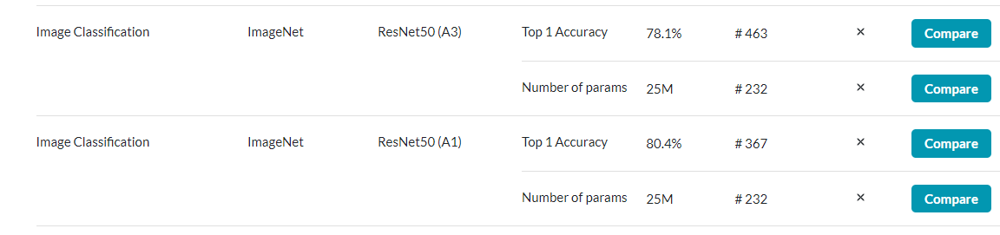

In [ ]:
resnet50 = models.resnet50()
# pass to device
resnet50.to(DEVICE)
resnet50 = Model("resnet50",model =resnet50 ,num_classes = len(images_map))


In [ ]:
train(30,resnet50)


 ******************************* Model :  resnet50  ******************************* 
Starting Training...



  0%|          | 0/30 [00:00<?, ?it/s]


-------------------------------   Epoch 1   -------------------------------

Train: Accuracy: 7.59%, Avg loss: 0.102612 



0it [00:00, ?it/s]

Valid: Accuracy: 9.52%, Avg loss: 0.326618 


-------------------------------   Epoch 2   -------------------------------

Train: Accuracy: 16.55%, Avg loss: 0.059503 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.239687 


-------------------------------   Epoch 3   -------------------------------

Train: Accuracy: 18.62%, Avg loss: 0.054340 



0it [00:00, ?it/s]

Valid: Accuracy: 11.11%, Avg loss: 0.116087 


-------------------------------   Epoch 4   -------------------------------

Train: Accuracy: 20.69%, Avg loss: 0.061834 



0it [00:00, ?it/s]

Valid: Accuracy: 17.46%, Avg loss: 0.143060 


-------------------------------   Epoch 5   -------------------------------

Train: Accuracy: 20.00%, Avg loss: 0.051182 



0it [00:00, ?it/s]

Valid: Accuracy: 19.05%, Avg loss: 0.170045 


-------------------------------   Epoch 6   -------------------------------

Train: Accuracy: 24.83%, Avg loss: 0.067393 



0it [00:00, ?it/s]

Valid: Accuracy: 20.63%, Avg loss: 0.132222 


-------------------------------   Epoch 7   -------------------------------

Train: Accuracy: 22.76%, Avg loss: 0.131064 



0it [00:00, ?it/s]

Valid: Accuracy: 19.05%, Avg loss: 0.152275 


-------------------------------   Epoch 8   -------------------------------

Train: Accuracy: 24.14%, Avg loss: 0.044952 



0it [00:00, ?it/s]

Valid: Accuracy: 23.81%, Avg loss: 0.182830 


-------------------------------   Epoch 9   -------------------------------

Train: Accuracy: 22.76%, Avg loss: 0.044969 



0it [00:00, ?it/s]

Valid: Accuracy: 12.70%, Avg loss: 0.141620 


-------------------------------   Epoch 10   -------------------------------

Train: Accuracy: 25.52%, Avg loss: 0.058752 



0it [00:00, ?it/s]

Valid: Accuracy: 20.63%, Avg loss: 0.150143 


-------------------------------   Epoch 11   -------------------------------

Train: Accuracy: 26.21%, Avg loss: 0.041231 



0it [00:00, ?it/s]

Valid: Accuracy: 15.87%, Avg loss: 0.097475 


-------------------------------   Epoch 12   -------------------------------

Train: Accuracy: 29.66%, Avg loss: 0.068869 



0it [00:00, ?it/s]

Valid: Accuracy: 23.81%, Avg loss: 0.114715 


-------------------------------   Epoch 13   -------------------------------

Train: Accuracy: 26.90%, Avg loss: 0.051481 



0it [00:00, ?it/s]

Valid: Accuracy: 17.46%, Avg loss: 0.189268 


-------------------------------   Epoch 14   -------------------------------

Train: Accuracy: 27.59%, Avg loss: 0.065443 



0it [00:00, ?it/s]

Valid: Accuracy: 30.16%, Avg loss: 0.098223 


-------------------------------   Epoch 15   -------------------------------

Train: Accuracy: 22.76%, Avg loss: 0.050624 



0it [00:00, ?it/s]

Valid: Accuracy: 15.87%, Avg loss: 0.121260 


-------------------------------   Epoch 16   -------------------------------

Train: Accuracy: 31.03%, Avg loss: 0.044982 



0it [00:00, ?it/s]

Valid: Accuracy: 22.22%, Avg loss: 0.147053 


-------------------------------   Epoch 17   -------------------------------

Train: Accuracy: 32.41%, Avg loss: 0.087436 



0it [00:00, ?it/s]

Valid: Accuracy: 26.98%, Avg loss: 0.106390 


-------------------------------   Epoch 18   -------------------------------

Train: Accuracy: 34.48%, Avg loss: 0.058603 



0it [00:00, ?it/s]

Valid: Accuracy: 17.46%, Avg loss: 0.104283 


-------------------------------   Epoch 19   -------------------------------

Train: Accuracy: 33.10%, Avg loss: 0.033616 



0it [00:00, ?it/s]

Valid: Accuracy: 25.40%, Avg loss: 0.095028 


-------------------------------   Epoch 20   -------------------------------

Train: Accuracy: 33.79%, Avg loss: 0.054166 



0it [00:00, ?it/s]

Valid: Accuracy: 30.16%, Avg loss: 0.146783 


-------------------------------   Epoch 21   -------------------------------

Train: Accuracy: 33.10%, Avg loss: 0.050395 



0it [00:00, ?it/s]

Valid: Accuracy: 26.98%, Avg loss: 0.110827 


-------------------------------   Epoch 22   -------------------------------

Train: Accuracy: 37.93%, Avg loss: 0.065109 



0it [00:00, ?it/s]

Valid: Accuracy: 22.22%, Avg loss: 0.116795 


-------------------------------   Epoch 23   -------------------------------

Train: Accuracy: 35.17%, Avg loss: 0.143621 



0it [00:00, ?it/s]

Valid: Accuracy: 30.16%, Avg loss: 0.119550 


-------------------------------   Epoch 24   -------------------------------

Train: Accuracy: 41.38%, Avg loss: 0.058187 



0it [00:00, ?it/s]

Valid: Accuracy: 23.81%, Avg loss: 0.108910 


-------------------------------   Epoch 25   -------------------------------

Train: Accuracy: 37.24%, Avg loss: 0.052804 



0it [00:00, ?it/s]

Valid: Accuracy: 25.40%, Avg loss: 0.084822 


-------------------------------   Epoch 26   -------------------------------

Train: Accuracy: 39.31%, Avg loss: 0.090594 



0it [00:00, ?it/s]

Valid: Accuracy: 31.75%, Avg loss: 0.115778 


-------------------------------   Epoch 27   -------------------------------

Train: Accuracy: 39.31%, Avg loss: 0.051618 



0it [00:00, ?it/s]

Valid: Accuracy: 19.05%, Avg loss: 0.111297 


-------------------------------   Epoch 28   -------------------------------

Train: Accuracy: 35.86%, Avg loss: 0.047804 



0it [00:00, ?it/s]

Valid: Accuracy: 39.68%, Avg loss: 0.107302 


-------------------------------   Epoch 29   -------------------------------

Train: Accuracy: 46.90%, Avg loss: 0.050599 



0it [00:00, ?it/s]

Valid: Accuracy: 33.33%, Avg loss: 0.116972 


-------------------------------   Epoch 30   -------------------------------

Train: Accuracy: 46.21%, Avg loss: 0.031688 



0it [00:00, ?it/s]

Valid: Accuracy: 36.51%, Avg loss: 0.073222 

Done!


In [ ]:
resnet50 = resnet50.to(cpu)
gc.collect()
torch.cuda.empty_cache()

## FPN (ResNet-101)
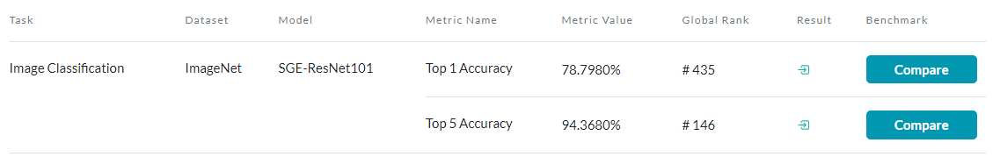

In [ ]:
resnet101 = models.resnet101()
# pass to device
resnet101.to(DEVICE)
resnet101 = Model("resnet101",model =resnet101 ,num_classes = len(images_map))


In [ ]:
train(30,resnet101)


 ******************************* Model :  resnet101  ******************************* 
Starting Training...



  0%|          | 0/30 [00:00<?, ?it/s]


-------------------------------   Epoch 1   -------------------------------

Train: Accuracy: 8.97%, Avg loss: 0.098391 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.351715 


-------------------------------   Epoch 2   -------------------------------

Train: Accuracy: 16.55%, Avg loss: 0.060485 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.336600 


-------------------------------   Epoch 3   -------------------------------

Train: Accuracy: 19.31%, Avg loss: 0.043777 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.239325 


-------------------------------   Epoch 4   -------------------------------

Train: Accuracy: 20.69%, Avg loss: 0.062338 



0it [00:00, ?it/s]

Valid: Accuracy: 12.70%, Avg loss: 0.167130 


-------------------------------   Epoch 5   -------------------------------

Train: Accuracy: 20.00%, Avg loss: 0.049375 



0it [00:00, ?it/s]

Valid: Accuracy: 19.05%, Avg loss: 0.124065 


-------------------------------   Epoch 6   -------------------------------

Train: Accuracy: 19.31%, Avg loss: 0.054829 



0it [00:00, ?it/s]

Valid: Accuracy: 12.70%, Avg loss: 0.136758 


-------------------------------   Epoch 7   -------------------------------

Train: Accuracy: 20.69%, Avg loss: 0.060927 



0it [00:00, ?it/s]

Valid: Accuracy: 23.81%, Avg loss: 0.108205 


-------------------------------   Epoch 8   -------------------------------

Train: Accuracy: 20.00%, Avg loss: 0.135806 



0it [00:00, ?it/s]

Valid: Accuracy: 19.05%, Avg loss: 0.162818 


-------------------------------   Epoch 9   -------------------------------

Train: Accuracy: 24.14%, Avg loss: 0.055516 



0it [00:00, ?it/s]

Valid: Accuracy: 9.52%, Avg loss: 0.136137 


-------------------------------   Epoch 10   -------------------------------

Train: Accuracy: 20.69%, Avg loss: 0.057861 



0it [00:00, ?it/s]

Valid: Accuracy: 14.29%, Avg loss: 0.129523 


-------------------------------   Epoch 11   -------------------------------

Train: Accuracy: 28.28%, Avg loss: 0.064029 



0it [00:00, ?it/s]

Valid: Accuracy: 23.81%, Avg loss: 0.140765 


-------------------------------   Epoch 12   -------------------------------

Train: Accuracy: 21.38%, Avg loss: 0.048632 



0it [00:00, ?it/s]

Valid: Accuracy: 15.87%, Avg loss: 0.150918 


-------------------------------   Epoch 13   -------------------------------

Train: Accuracy: 23.45%, Avg loss: 0.054008 



0it [00:00, ?it/s]

Valid: Accuracy: 20.63%, Avg loss: 0.210735 


-------------------------------   Epoch 14   -------------------------------

Train: Accuracy: 24.83%, Avg loss: 0.050232 



0it [00:00, ?it/s]

Valid: Accuracy: 20.63%, Avg loss: 0.131772 


-------------------------------   Epoch 15   -------------------------------

Train: Accuracy: 28.28%, Avg loss: 0.071144 



0it [00:00, ?it/s]

Valid: Accuracy: 15.87%, Avg loss: 0.109168 


-------------------------------   Epoch 16   -------------------------------

Train: Accuracy: 26.21%, Avg loss: 0.051494 



0it [00:00, ?it/s]

Valid: Accuracy: 25.40%, Avg loss: 0.094588 


-------------------------------   Epoch 17   -------------------------------

Train: Accuracy: 28.97%, Avg loss: 0.051109 



0it [00:00, ?it/s]

Valid: Accuracy: 20.63%, Avg loss: 0.110740 


-------------------------------   Epoch 18   -------------------------------

Train: Accuracy: 26.90%, Avg loss: 0.044059 



0it [00:00, ?it/s]

Valid: Accuracy: 19.05%, Avg loss: 0.106637 


-------------------------------   Epoch 19   -------------------------------

Train: Accuracy: 35.86%, Avg loss: 0.044791 



0it [00:00, ?it/s]

Valid: Accuracy: 28.57%, Avg loss: 0.144207 


-------------------------------   Epoch 20   -------------------------------

Train: Accuracy: 30.34%, Avg loss: 0.052073 



0it [00:00, ?it/s]

Valid: Accuracy: 20.63%, Avg loss: 0.173550 


-------------------------------   Epoch 21   -------------------------------

Train: Accuracy: 24.14%, Avg loss: 0.064908 



0it [00:00, ?it/s]

Valid: Accuracy: 17.46%, Avg loss: 0.125905 


-------------------------------   Epoch 22   -------------------------------

Train: Accuracy: 31.72%, Avg loss: 0.052483 



0it [00:00, ?it/s]

Valid: Accuracy: 26.98%, Avg loss: 0.093577 


-------------------------------   Epoch 23   -------------------------------

Train: Accuracy: 29.66%, Avg loss: 0.068202 



0it [00:00, ?it/s]

Valid: Accuracy: 25.40%, Avg loss: 0.102790 


-------------------------------   Epoch 24   -------------------------------

Train: Accuracy: 28.97%, Avg loss: 0.038685 



0it [00:00, ?it/s]

Valid: Accuracy: 25.40%, Avg loss: 0.132450 


-------------------------------   Epoch 25   -------------------------------

Train: Accuracy: 29.66%, Avg loss: 0.046714 



0it [00:00, ?it/s]

Valid: Accuracy: 17.46%, Avg loss: 0.165330 


-------------------------------   Epoch 26   -------------------------------

Train: Accuracy: 28.28%, Avg loss: 0.048199 



0it [00:00, ?it/s]

Valid: Accuracy: 17.46%, Avg loss: 0.166162 


-------------------------------   Epoch 27   -------------------------------

Train: Accuracy: 31.03%, Avg loss: 0.056743 



0it [00:00, ?it/s]

Valid: Accuracy: 25.40%, Avg loss: 0.137535 


-------------------------------   Epoch 28   -------------------------------

Train: Accuracy: 36.55%, Avg loss: 0.049397 



0it [00:00, ?it/s]

Valid: Accuracy: 28.57%, Avg loss: 0.072410 


-------------------------------   Epoch 29   -------------------------------

Train: Accuracy: 33.10%, Avg loss: 0.072682 



0it [00:00, ?it/s]

Valid: Accuracy: 22.22%, Avg loss: 0.119265 


-------------------------------   Epoch 30   -------------------------------

Train: Accuracy: 37.93%, Avg loss: 0.054646 



0it [00:00, ?it/s]

Valid: Accuracy: 28.57%, Avg loss: 0.106560 

Done!


In [ ]:
resnet101 = resnet101.to(cpu)
gc.collect()
torch.cuda.empty_cache()

## MobileNetV3
* MobileNetV3 is a convolutional neural network that is designed for mobile phone CPUs.
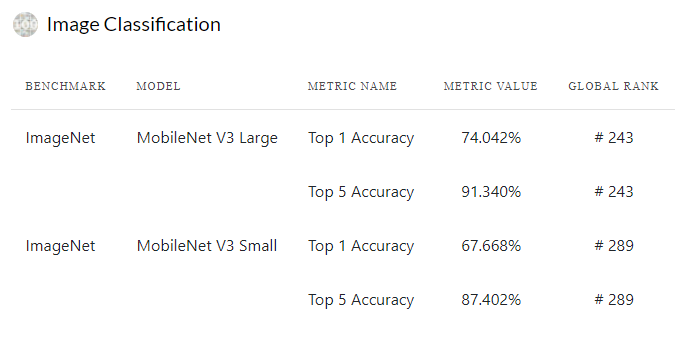

In [ ]:
mobilenet_v3_large = models.mobilenet_v3_large()
# pass to device
mobilenet_v3_large.to(DEVICE)
mobilenet_v3_large = Model("mobilenet_v3_large",model =mobilenet_v3_large ,num_classes = len(images_map))

In [ ]:
train(30,mobilenet_v3_large)


 ******************************* Model :  mobilenet_v3_large  ******************************* 
Starting Training...



  0%|          | 0/30 [00:00<?, ?it/s]


-------------------------------   Epoch 1   -------------------------------

Train: Accuracy: 7.59%, Avg loss: 0.170305 



0it [00:00, ?it/s]

Valid: Accuracy: 6.35%, Avg loss: 0.430623 


-------------------------------   Epoch 2   -------------------------------

Train: Accuracy: 18.62%, Avg loss: 0.159013 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.430208 


-------------------------------   Epoch 3   -------------------------------

Train: Accuracy: 15.86%, Avg loss: 0.157406 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.428935 


-------------------------------   Epoch 4   -------------------------------

Train: Accuracy: 13.79%, Avg loss: 0.140886 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.425783 


-------------------------------   Epoch 5   -------------------------------

Train: Accuracy: 14.48%, Avg loss: 0.117726 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.420450 


-------------------------------   Epoch 6   -------------------------------

Train: Accuracy: 14.48%, Avg loss: 0.081379 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.410733 


-------------------------------   Epoch 7   -------------------------------

Train: Accuracy: 18.62%, Avg loss: 0.067791 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.398680 


-------------------------------   Epoch 8   -------------------------------

Train: Accuracy: 18.62%, Avg loss: 0.061674 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.381377 


-------------------------------   Epoch 9   -------------------------------

Train: Accuracy: 20.69%, Avg loss: 0.049225 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.367230 


-------------------------------   Epoch 10   -------------------------------

Train: Accuracy: 18.62%, Avg loss: 0.048752 



0it [00:00, ?it/s]

Valid: Accuracy: 6.35%, Avg loss: 0.352382 


-------------------------------   Epoch 11   -------------------------------

Train: Accuracy: 22.76%, Avg loss: 0.052576 



0it [00:00, ?it/s]

Valid: Accuracy: 6.35%, Avg loss: 0.345700 


-------------------------------   Epoch 12   -------------------------------

Train: Accuracy: 24.14%, Avg loss: 0.065766 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.337323 


-------------------------------   Epoch 13   -------------------------------

Train: Accuracy: 26.90%, Avg loss: 0.052274 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.324773 


-------------------------------   Epoch 14   -------------------------------

Train: Accuracy: 19.31%, Avg loss: 0.110952 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.313540 


-------------------------------   Epoch 15   -------------------------------

Train: Accuracy: 24.14%, Avg loss: 0.106155 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.302595 


-------------------------------   Epoch 16   -------------------------------

Train: Accuracy: 26.90%, Avg loss: 0.053183 



0it [00:00, ?it/s]

Valid: Accuracy: 6.35%, Avg loss: 0.292592 


-------------------------------   Epoch 17   -------------------------------

Train: Accuracy: 21.38%, Avg loss: 0.046394 



0it [00:00, ?it/s]

Valid: Accuracy: 6.35%, Avg loss: 0.285900 


-------------------------------   Epoch 18   -------------------------------

Train: Accuracy: 29.66%, Avg loss: 0.063625 



0it [00:00, ?it/s]

Valid: Accuracy: 6.35%, Avg loss: 0.277715 


-------------------------------   Epoch 19   -------------------------------

Train: Accuracy: 25.52%, Avg loss: 0.036781 



0it [00:00, ?it/s]

Valid: Accuracy: 6.35%, Avg loss: 0.274010 


-------------------------------   Epoch 20   -------------------------------

Train: Accuracy: 26.21%, Avg loss: 0.070275 



0it [00:00, ?it/s]

Valid: Accuracy: 6.35%, Avg loss: 0.262715 


-------------------------------   Epoch 21   -------------------------------

Train: Accuracy: 27.59%, Avg loss: 0.062528 



0it [00:00, ?it/s]

Valid: Accuracy: 6.35%, Avg loss: 0.255550 


-------------------------------   Epoch 22   -------------------------------

Train: Accuracy: 31.72%, Avg loss: 0.047814 



0it [00:00, ?it/s]

Valid: Accuracy: 6.35%, Avg loss: 0.249457 


-------------------------------   Epoch 23   -------------------------------

Train: Accuracy: 30.34%, Avg loss: 0.046860 



0it [00:00, ?it/s]

Valid: Accuracy: 6.35%, Avg loss: 0.237717 


-------------------------------   Epoch 24   -------------------------------

Train: Accuracy: 30.34%, Avg loss: 0.053457 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.225818 


-------------------------------   Epoch 25   -------------------------------

Train: Accuracy: 27.59%, Avg loss: 0.061449 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.228120 


-------------------------------   Epoch 26   -------------------------------

Train: Accuracy: 31.03%, Avg loss: 0.039901 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.220445 


-------------------------------   Epoch 27   -------------------------------

Train: Accuracy: 26.21%, Avg loss: 0.055728 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.215510 


-------------------------------   Epoch 28   -------------------------------

Train: Accuracy: 33.10%, Avg loss: 0.066345 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.212155 


-------------------------------   Epoch 29   -------------------------------

Train: Accuracy: 33.10%, Avg loss: 0.060067 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.201923 


-------------------------------   Epoch 30   -------------------------------

Train: Accuracy: 32.41%, Avg loss: 0.046508 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.206058 

Done!


In [ ]:
mobilenet_v3_large = mobilenet_v3_large.to(cpu)
gc.collect()
torch.cuda.empty_cache()

## EfficientNetB6
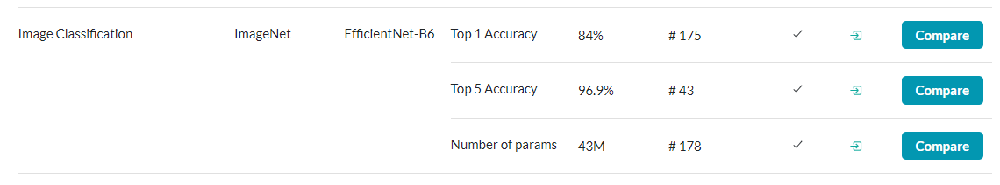

In [ ]:
efficientnet_b6 = models.efficientnet_b6()
# pass to device
efficientnet_b6.to(DEVICE)
efficientnet_b6 = Model("efficientnet_b6",model =efficientnet_b6 ,num_classes = len(images_map))

In [ ]:
train(30,efficientnet_b6)


 ******************************* Model :  efficientnet_b6  ******************************* 
Starting Training...



  0%|          | 0/30 [00:00<?, ?it/s]


-------------------------------   Epoch 1   -------------------------------

Train: Accuracy: 4.83%, Avg loss: 0.165287 



0it [00:00, ?it/s]

Valid: Accuracy: 3.17%, Avg loss: 0.430082 


-------------------------------   Epoch 2   -------------------------------

Train: Accuracy: 7.59%, Avg loss: 0.152654 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.429460 


-------------------------------   Epoch 3   -------------------------------

Train: Accuracy: 9.66%, Avg loss: 0.135265 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.426855 


-------------------------------   Epoch 4   -------------------------------

Train: Accuracy: 10.34%, Avg loss: 0.128804 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.425260 


-------------------------------   Epoch 5   -------------------------------

Train: Accuracy: 12.41%, Avg loss: 0.130783 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.420073 


-------------------------------   Epoch 6   -------------------------------

Train: Accuracy: 13.79%, Avg loss: 0.123459 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.417455 


-------------------------------   Epoch 7   -------------------------------

Train: Accuracy: 13.10%, Avg loss: 0.121568 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.413285 


-------------------------------   Epoch 8   -------------------------------

Train: Accuracy: 11.03%, Avg loss: 0.110942 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.408282 


-------------------------------   Epoch 9   -------------------------------

Train: Accuracy: 13.79%, Avg loss: 0.096286 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.404305 


-------------------------------   Epoch 10   -------------------------------

Train: Accuracy: 12.41%, Avg loss: 0.092117 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.398350 


-------------------------------   Epoch 11   -------------------------------

Train: Accuracy: 11.72%, Avg loss: 0.107935 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.394703 


-------------------------------   Epoch 12   -------------------------------

Train: Accuracy: 14.48%, Avg loss: 0.062186 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.391025 


-------------------------------   Epoch 13   -------------------------------

Train: Accuracy: 14.48%, Avg loss: 0.078389 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.383408 


-------------------------------   Epoch 14   -------------------------------

Train: Accuracy: 24.14%, Avg loss: 0.075648 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.380845 


-------------------------------   Epoch 15   -------------------------------

Train: Accuracy: 18.62%, Avg loss: 0.108550 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.371305 


-------------------------------   Epoch 16   -------------------------------

Train: Accuracy: 15.86%, Avg loss: 0.058752 



0it [00:00, ?it/s]

Valid: Accuracy: 3.17%, Avg loss: 0.370380 


-------------------------------   Epoch 17   -------------------------------

Train: Accuracy: 15.17%, Avg loss: 0.074563 



0it [00:00, ?it/s]

Valid: Accuracy: 3.17%, Avg loss: 0.355168 


-------------------------------   Epoch 18   -------------------------------

Train: Accuracy: 18.62%, Avg loss: 0.050769 



0it [00:00, ?it/s]

Valid: Accuracy: 3.17%, Avg loss: 0.353950 


-------------------------------   Epoch 19   -------------------------------

Train: Accuracy: 17.93%, Avg loss: 0.051341 



0it [00:00, ?it/s]

Valid: Accuracy: 3.17%, Avg loss: 0.344857 


-------------------------------   Epoch 20   -------------------------------

Train: Accuracy: 20.00%, Avg loss: 0.045659 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.336633 


-------------------------------   Epoch 21   -------------------------------

Train: Accuracy: 15.86%, Avg loss: 0.049040 



0it [00:00, ?it/s]

Valid: Accuracy: 3.17%, Avg loss: 0.331572 


-------------------------------   Epoch 22   -------------------------------

Train: Accuracy: 17.24%, Avg loss: 0.053207 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.325572 


-------------------------------   Epoch 23   -------------------------------

Train: Accuracy: 20.69%, Avg loss: 0.068278 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.316273 


-------------------------------   Epoch 24   -------------------------------

Train: Accuracy: 26.90%, Avg loss: 0.055369 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.308497 


-------------------------------   Epoch 25   -------------------------------

Train: Accuracy: 22.07%, Avg loss: 0.052711 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.304495 


-------------------------------   Epoch 26   -------------------------------

Train: Accuracy: 27.59%, Avg loss: 0.050483 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.293922 


-------------------------------   Epoch 27   -------------------------------

Train: Accuracy: 29.66%, Avg loss: 0.048386 



0it [00:00, ?it/s]

Valid: Accuracy: 9.52%, Avg loss: 0.288580 


-------------------------------   Epoch 28   -------------------------------

Train: Accuracy: 22.76%, Avg loss: 0.046884 



0it [00:00, ?it/s]

Valid: Accuracy: 9.52%, Avg loss: 0.280508 


-------------------------------   Epoch 29   -------------------------------

Train: Accuracy: 23.45%, Avg loss: 0.107159 



0it [00:00, ?it/s]

Valid: Accuracy: 9.52%, Avg loss: 0.275545 


-------------------------------   Epoch 30   -------------------------------

Train: Accuracy: 21.38%, Avg loss: 0.061004 



0it [00:00, ?it/s]

Valid: Accuracy: 9.52%, Avg loss: 0.267045 

Done!


In [ ]:
efficientnet_b6 = efficientnet_b6.to(cpu)
gc.collect()
torch.cuda.empty_cache()

## Vision Transformer
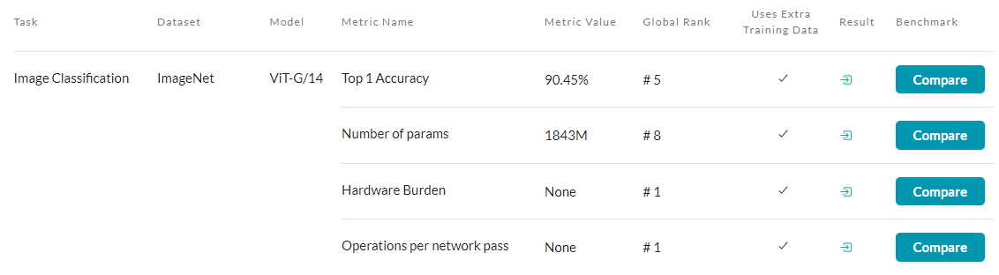

In [ ]:
vit_b_16 = models.vit_b_16()
# pass to device
vit_b_16.to(DEVICE)
vit_b_16 = Model("vit_b_16",model =vit_b_16 ,num_classes = len(images_map))

In [ ]:
train(30,vit_b_16)


 ******************************* Model :  vit_b_16  ******************************* 
Starting Training...



  0%|          | 0/30 [00:00<?, ?it/s]


-------------------------------   Epoch 1   -------------------------------

Train: Accuracy: 8.28%, Avg loss: 0.146049 



0it [00:00, ?it/s]

Valid: Accuracy: 6.35%, Avg loss: 0.352807 


-------------------------------   Epoch 2   -------------------------------

Train: Accuracy: 8.97%, Avg loss: 0.112026 



0it [00:00, ?it/s]

Valid: Accuracy: 6.35%, Avg loss: 0.271267 


-------------------------------   Epoch 3   -------------------------------

Train: Accuracy: 8.97%, Avg loss: 0.082846 



0it [00:00, ?it/s]

Valid: Accuracy: 6.35%, Avg loss: 0.212367 


-------------------------------   Epoch 4   -------------------------------

Train: Accuracy: 8.97%, Avg loss: 0.084117 



0it [00:00, ?it/s]

Valid: Accuracy: 6.35%, Avg loss: 0.179718 


-------------------------------   Epoch 5   -------------------------------

Train: Accuracy: 8.97%, Avg loss: 0.073213 



0it [00:00, ?it/s]

Valid: Accuracy: 6.35%, Avg loss: 0.155020 


-------------------------------   Epoch 6   -------------------------------

Train: Accuracy: 8.97%, Avg loss: 0.055575 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.160312 


-------------------------------   Epoch 7   -------------------------------

Train: Accuracy: 10.34%, Avg loss: 0.059439 



0it [00:00, ?it/s]

Valid: Accuracy: 9.52%, Avg loss: 0.155282 


-------------------------------   Epoch 8   -------------------------------

Train: Accuracy: 6.90%, Avg loss: 0.054478 



0it [00:00, ?it/s]

Valid: Accuracy: 9.52%, Avg loss: 0.154493 


-------------------------------   Epoch 9   -------------------------------

Train: Accuracy: 12.41%, Avg loss: 0.054078 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.159120 


-------------------------------   Epoch 10   -------------------------------

Train: Accuracy: 15.17%, Avg loss: 0.043904 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.142050 


-------------------------------   Epoch 11   -------------------------------

Train: Accuracy: 13.79%, Avg loss: 0.053652 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.173097 


-------------------------------   Epoch 12   -------------------------------

Train: Accuracy: 17.24%, Avg loss: 0.050373 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.157222 


-------------------------------   Epoch 13   -------------------------------

Train: Accuracy: 15.17%, Avg loss: 0.047283 



0it [00:00, ?it/s]

Valid: Accuracy: 12.70%, Avg loss: 0.151410 


-------------------------------   Epoch 14   -------------------------------

Train: Accuracy: 18.62%, Avg loss: 0.098004 



0it [00:00, ?it/s]

Valid: Accuracy: 11.11%, Avg loss: 0.171412 


-------------------------------   Epoch 15   -------------------------------

Train: Accuracy: 18.62%, Avg loss: 0.054827 



0it [00:00, ?it/s]

Valid: Accuracy: 11.11%, Avg loss: 0.145270 


-------------------------------   Epoch 16   -------------------------------

Train: Accuracy: 14.48%, Avg loss: 0.057109 



0it [00:00, ?it/s]

Valid: Accuracy: 15.87%, Avg loss: 0.154798 


-------------------------------   Epoch 17   -------------------------------

Train: Accuracy: 17.24%, Avg loss: 0.024737 



0it [00:00, ?it/s]

Valid: Accuracy: 15.87%, Avg loss: 0.139272 


-------------------------------   Epoch 18   -------------------------------

Train: Accuracy: 14.48%, Avg loss: 0.051273 



0it [00:00, ?it/s]

Valid: Accuracy: 17.46%, Avg loss: 0.135022 


-------------------------------   Epoch 19   -------------------------------

Train: Accuracy: 15.17%, Avg loss: 0.047591 



0it [00:00, ?it/s]

Valid: Accuracy: 11.11%, Avg loss: 0.136495 


-------------------------------   Epoch 20   -------------------------------

Train: Accuracy: 17.24%, Avg loss: 0.002777 



0it [00:00, ?it/s]

Valid: Accuracy: 12.70%, Avg loss: 0.138428 


-------------------------------   Epoch 21   -------------------------------

Train: Accuracy: 19.31%, Avg loss: 0.051922 



0it [00:00, ?it/s]

Valid: Accuracy: 12.70%, Avg loss: 0.133387 


-------------------------------   Epoch 22   -------------------------------

Train: Accuracy: 19.31%, Avg loss: 0.047753 



0it [00:00, ?it/s]

Valid: Accuracy: 14.29%, Avg loss: 0.151365 


-------------------------------   Epoch 23   -------------------------------

Train: Accuracy: 17.24%, Avg loss: 0.054243 



0it [00:00, ?it/s]

Valid: Accuracy: 11.11%, Avg loss: 0.129107 


-------------------------------   Epoch 24   -------------------------------

Train: Accuracy: 17.93%, Avg loss: 0.000461 



0it [00:00, ?it/s]

Valid: Accuracy: 11.11%, Avg loss: 0.138400 


-------------------------------   Epoch 25   -------------------------------

Train: Accuracy: 17.24%, Avg loss: 0.051542 



0it [00:00, ?it/s]

Valid: Accuracy: 15.87%, Avg loss: 0.120872 


-------------------------------   Epoch 26   -------------------------------

Train: Accuracy: 17.24%, Avg loss: 0.056244 



0it [00:00, ?it/s]

Valid: Accuracy: 14.29%, Avg loss: 0.132038 


-------------------------------   Epoch 27   -------------------------------

Train: Accuracy: 17.93%, Avg loss: 0.096575 



0it [00:00, ?it/s]

Valid: Accuracy: 14.29%, Avg loss: 0.101775 


-------------------------------   Epoch 28   -------------------------------

Train: Accuracy: 17.93%, Avg loss: 0.046004 



0it [00:00, ?it/s]

Valid: Accuracy: 12.70%, Avg loss: 0.145225 


-------------------------------   Epoch 29   -------------------------------

Train: Accuracy: 18.62%, Avg loss: 0.051221 



0it [00:00, ?it/s]

Valid: Accuracy: 12.70%, Avg loss: 0.131898 


-------------------------------   Epoch 30   -------------------------------

Train: Accuracy: 19.31%, Avg loss: 0.057345 



0it [00:00, ?it/s]

Valid: Accuracy: 12.70%, Avg loss: 0.114397 

Done!


In [ ]:
vit_b_16 = vit_b_16.to(cpu)
gc.collect()
torch.cuda.empty_cache()

<a name="graphs"></a>

# Evaluation Trainning results

In [ ]:
def plot_results(models_lst, rows = 7, cols = 2):
  # cpu = torch.device("cpu")
  fig = plt.figure(figsize = (24, 24))
  fig.suptitle(f"Training Results", fontsize = 18)

  space = np.arange(1, N_EPOCHS + 1, 1)
  if N_EPOCHS <= 20:
    x_ticks = np.arange(1, N_EPOCHS + 1, 1)
  else:
    x_ticks = np.arange(1, N_EPOCHS + 1, int(N_EPOCHS/20) + 1)
  # x_ticks = np.arange(1, N_EPOCHS + 1, 1)
  i = 1
  for model in models_lst:
    # Loss plot
    # model = model.to(cpu)
    ax1 = plt.subplot(rows, cols, i) 
    ax1.plot(space, model.train_loss_history, label='Training', color = 'orange')
    ax1.plot(space, model.valid_loss_history, label='Validation', color = 'blue')
    plt.xticks(x_ticks)
    plt.axhline(0, linestyle = 'dashed', color = 'grey')
    plt.axvline(model.best_epoch, linestyle = 'dashed', color = 'green', label = 'Best val loss: ep ' + str(model.best_epoch))
    plt.title(f"{model.model_name} Loss")
    ax1.legend(frameon=False);

    # Accuracy plot
    ax2 = plt.subplot(rows, cols, i+1)
    ax2.plot(space, model.train_acc_history, label='Training', color = 'orange')
    ax2.plot(space, model.valid_acc_history, label='Validation', color = 'blue')
    plt.xticks(x_ticks)
    plt.axhline(0.99, linestyle = 'dashed', color = 'grey')
    plt.axvline(model.best_epoch, linestyle = 'dashed', color = 'green', label = 'Best val acc: ep ' + str(model.best_epoch))
    plt.title(f"{model.model_name} Accuracy")
    ax2.legend(frameon=False);
    i+=2
  
  plt.show()

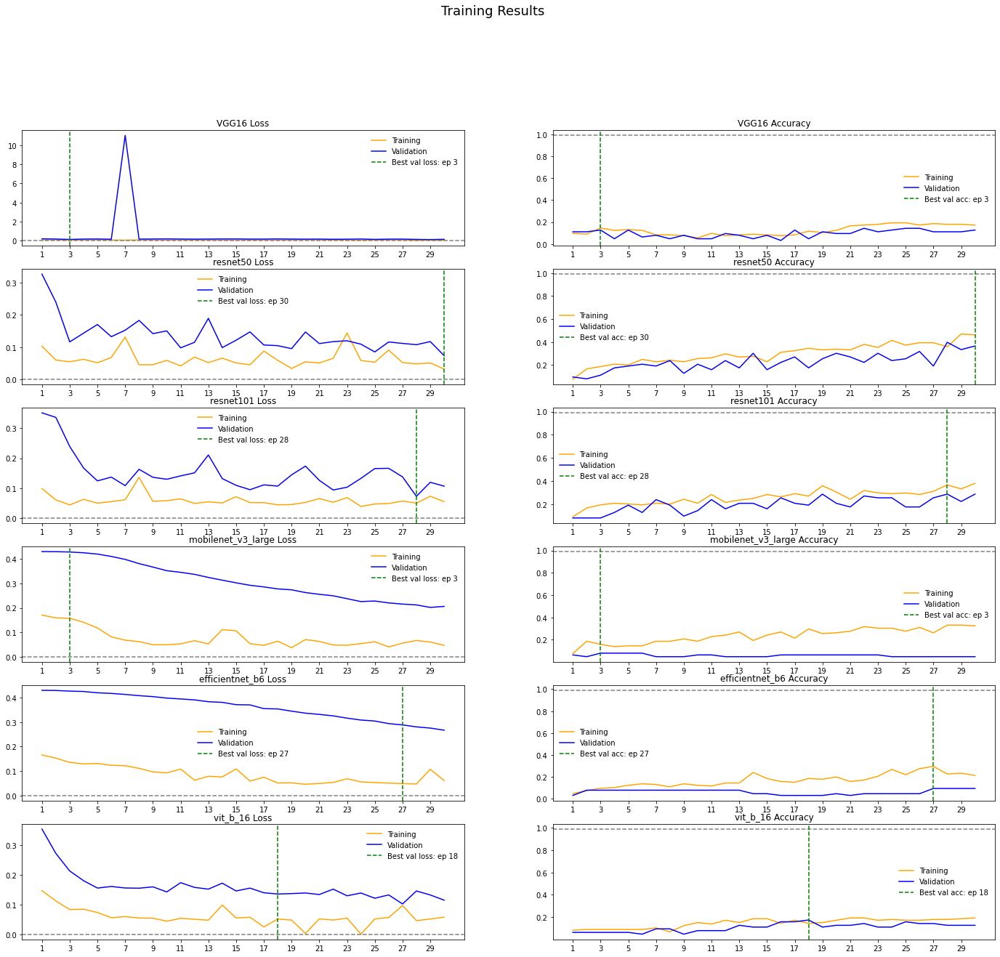

In [ ]:
N_EPOCHS = 30
models_lst = [vgg16_model,resnet50,resnet101,mobilenet_v3_large,efficientnet_b6,vit_b_16]
plot_results(models_lst)

<a name="statistics"></a>

## Confusion Matrix

In [ ]:
#after train we want to do prediction for valdtaion data (in trainning mode) or test data (on test mode)
def predict(model,valid_dataloader,optimizer):
    Y_predict = []
    T = []
    model.eval()
    with torch.no_grad():
      for batch, (x_train, y_name, y_train) in enumerate(valid_dataloader):
        optimizer.zero_grad()
        x_train = x_train.permute(0,3,1,2).float() 
        output = model(x_train)
        for i in torch.argmax(output,1):
          Y_predict.append(i.item( ))
        for i in y_train:
          T.append(i.item())
    return Y_predict, T

for model in tqdm(models_lst):
    model.Y_pred,model.T =  predict(model, valid_loader,model.optimizer) 
    model.fscore = f1_score(model.Y_pred,model.T,average='macro')

  0%|          | 0/6 [00:00<?, ?it/s]

0it [00:00, ?it/s]

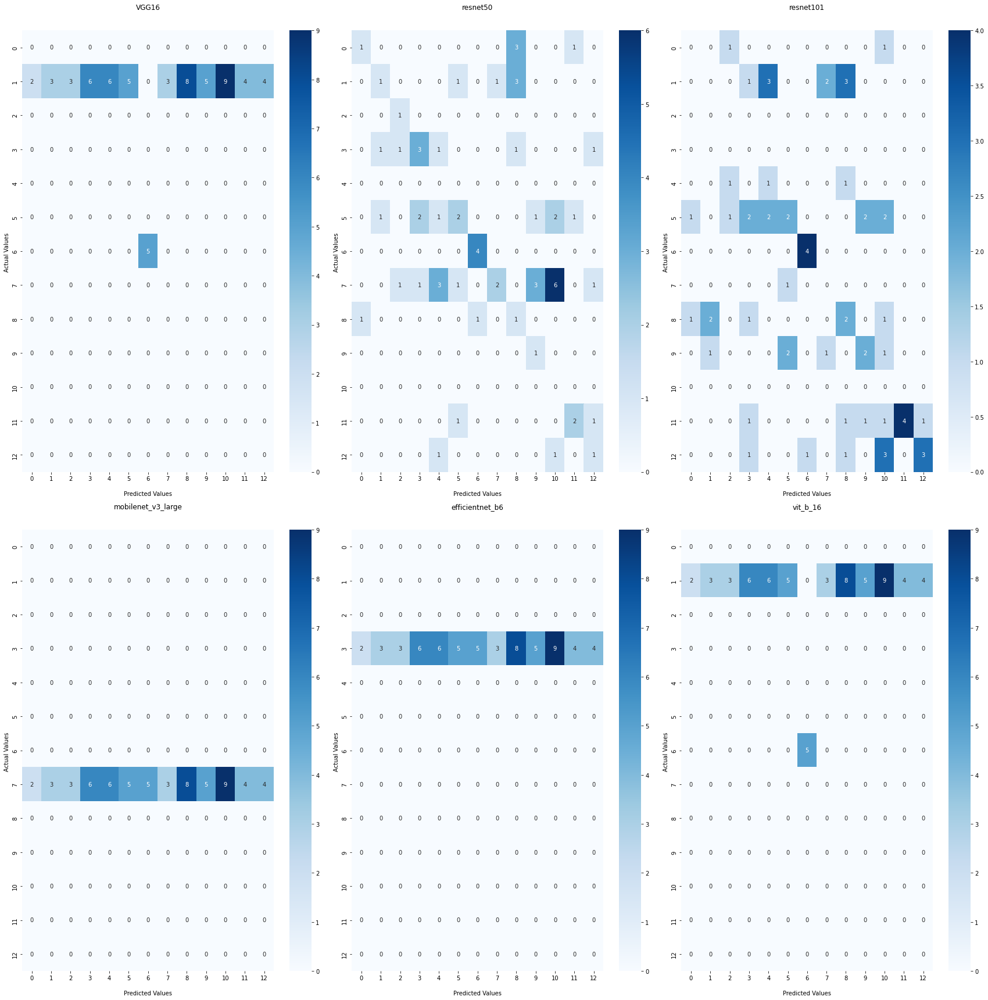

In [ ]:
#execute and apply confusion matrix
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24,24))
for model, ax in tqdm(zip(models_lst, axes.flatten())):
  model.cf_matrix = confusion_matrix(model.Y_pred,model.T)
    
  sns.heatmap(model.cf_matrix, annot=True, cmap='Blues',fmt='g',ax=ax)
  ax.title.set_text(f'{model.model_name}\n\n')
  ax.set_xlabel('\nPredicted Values')
  ax.set_ylabel('Actual Values ')

plt.tight_layout()  
plt.show()

## ROC curve - Reciever Operating Characteristic 

0it [00:00, ?it/s]

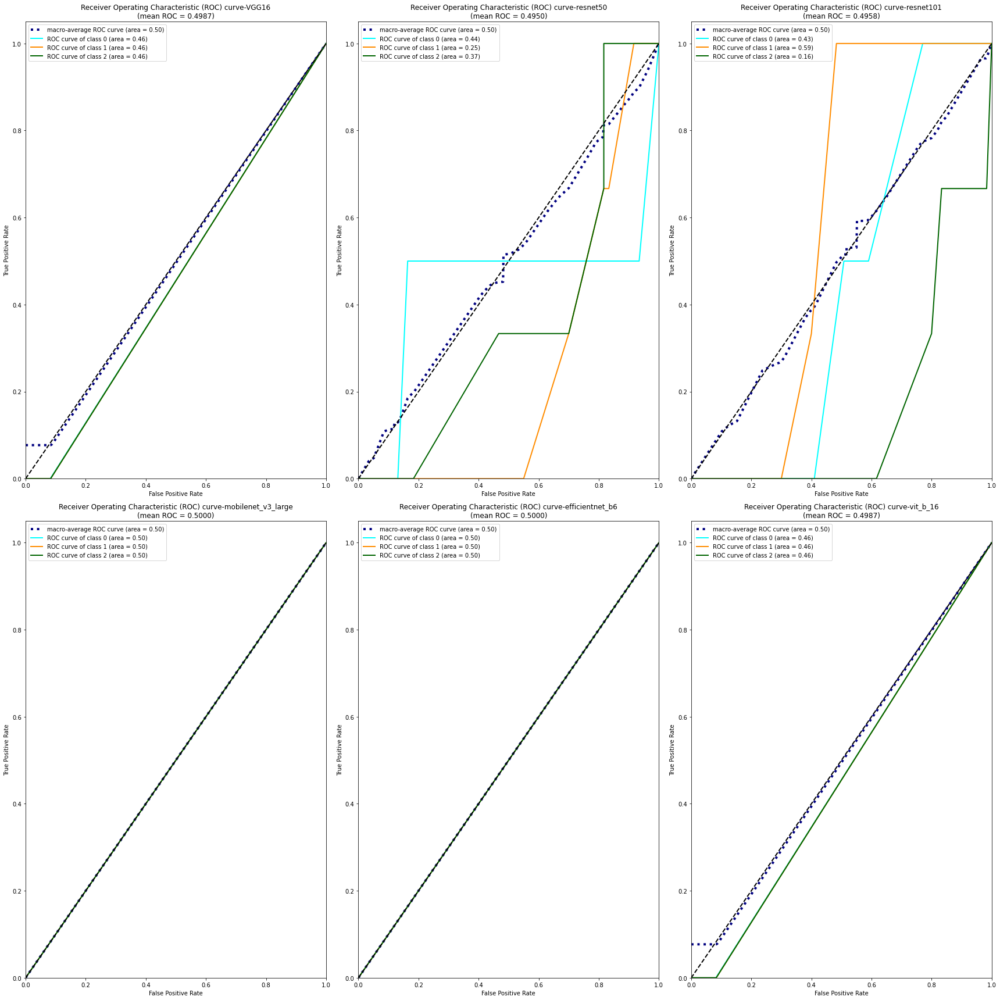

In [ ]:
# plot ROC curve and calculate AUC score
# Compute ROC curve and ROC area for each class

def plot_multiclass_roc(models_lst, classes):
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24,24))
    colors = ["aqua", "darkorange", "darkgreen"]
    for model, ax in tqdm(zip(models_lst, axes.flatten())):
      fpr = dict()
      tpr = dict()
      roc_auc = dict()
      for i in range(classes):
        fpr[i], tpr[i], _ = roc_curve(np.array(model.T), np.array(model.Y_pred), pos_label=i)
        roc_auc[i] = auc(fpr[i], tpr[i])
      # First aggregate all false positive rates
      all_fpr = np.unique(np.concatenate([fpr[i] for i in range(classes)]))
      # Then interpolate all ROC curves at this points
      mean_tpr = np.zeros_like(all_fpr)
      for i in range(classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

      # Finally average it and compute AUC
      mean_tpr /= classes
      fpr["macro"] = all_fpr
      tpr["macro"] = mean_tpr
      roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

      ax.plot(fpr["macro"], tpr["macro"],
      label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
      color="navy", linestyle=":", linewidth=4,)
      for i, color in zip(range(classes), colors):
        ax.plot(fpr[i], tpr[i], color=color, lw=2,
            label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),)
          
      ax.plot([0, 1], [0, 1], "k--", lw=2)

      ax.axis([0.0, 1.0, 0.0, 1.05])
      ax.set_xlabel("False Positive Rate")
      ax.set_ylabel("True Positive Rate")
      ax.title.set_text("Receiver Operating Characteristic (ROC) curve-" +model.model_name+
                        "\n(mean ROC = {0:0.4f})".format(sum(roc_auc.values()) / len(roc_auc),))
      
      ax.legend()
        
    plt.tight_layout()  
    plt.show()
    
plot_multiclass_roc(models_lst, num_classes)

## Conclusions
As you can see the results of the module are not very good but of all the models, the resNet models brought the best performance

# Ensamble_model

In [ ]:
class EnsembleModel(nn.Module):   
  def __init__(self, modelA, modelB, modelC,modelD,modelE,num_classes = 3):
    super().__init__()
    self.modelA = modelA
    self.modelB = modelB
    self.modelC = modelC
    self.modelD = modelD
    self.modelE = modelE
    
    self.classifier = nn.Linear(5000, num_classes)
      
  def forward(self, x):
    x1 = self.modelA(x)
    x2 = self.modelB(x)
    x3 = self.modelC(x)
    x4 = self.modelD(x)
    x5 = self.modelE(x)
    x = torch.cat((x1, x2, x3,x4,x5), dim=1)
    out = self.classifier(x)
    return out

  def train_mode(self):
    self.best_loss = np.inf
    self.best_epoch = 0
    self.best_acc = 0
    self.train_loss_history = []
    self.train_acc_history = []
      
  def valid_mode(self):
    self.valid_loss_history = []
    self.valid_acc_history = []



In [ ]:
ensemble_model = EnsembleModel(resnet50,resnet101,mobilenet_v3_large,efficientnet_b6,vit_b_16,len(images_map))

for param in ensemble_model.parameters():
    param.requires_grad = False

for param in ensemble_model.classifier.parameters():
    param.requires_grad = True

In [ ]:
# DEVICE = cpu
ensemble_model.model_name = 'Ensemble Model'
ensemble_model = ensemble_model.to(DEVICE)
train(30,ensemble_model)
# train_valid(train_dataloader,valid_dataloader, ensemble_model, device)

ensemble_model = ensemble_model.to(cpu)
gc.collect()
torch.cuda.empty_cache()


 ******************************* Model :  Ensemble Model  ******************************* 
Starting Training...



  0%|          | 0/30 [00:00<?, ?it/s]


-------------------------------   Epoch 1   -------------------------------

Train: Accuracy: 4.83%, Avg loss: 0.032358 



0it [00:00, ?it/s]

Valid: Accuracy: 6.35%, Avg loss: 0.200217 


-------------------------------   Epoch 2   -------------------------------

Train: Accuracy: 8.28%, Avg loss: 0.083074 



0it [00:00, ?it/s]

Valid: Accuracy: 4.76%, Avg loss: 0.413070 


-------------------------------   Epoch 3   -------------------------------

Train: Accuracy: 11.03%, Avg loss: 0.074943 



0it [00:00, ?it/s]

Valid: Accuracy: 6.35%, Avg loss: 0.172992 


-------------------------------   Epoch 4   -------------------------------

Train: Accuracy: 8.97%, Avg loss: 0.033293 



0it [00:00, ?it/s]

Valid: Accuracy: 17.46%, Avg loss: 0.360202 


-------------------------------   Epoch 5   -------------------------------

Train: Accuracy: 11.72%, Avg loss: 0.064153 



0it [00:00, ?it/s]

Valid: Accuracy: 11.11%, Avg loss: 0.239995 


-------------------------------   Epoch 6   -------------------------------

Train: Accuracy: 9.66%, Avg loss: 0.097930 



0it [00:00, ?it/s]

Valid: Accuracy: 7.94%, Avg loss: 0.231612 


-------------------------------   Epoch 7   -------------------------------

Train: Accuracy: 17.93%, Avg loss: 0.077326 



0it [00:00, ?it/s]

Valid: Accuracy: 14.29%, Avg loss: 0.222812 


-------------------------------   Epoch 8   -------------------------------

Train: Accuracy: 12.41%, Avg loss: 0.032358 



0it [00:00, ?it/s]

Valid: Accuracy: 9.52%, Avg loss: 0.160367 


-------------------------------   Epoch 9   -------------------------------

Train: Accuracy: 15.17%, Avg loss: 0.036966 



0it [00:00, ?it/s]

Valid: Accuracy: 15.87%, Avg loss: 0.129795 


-------------------------------   Epoch 10   -------------------------------

Train: Accuracy: 20.69%, Avg loss: 0.062054 



0it [00:00, ?it/s]

Valid: Accuracy: 11.11%, Avg loss: 0.131648 


-------------------------------   Epoch 11   -------------------------------

Train: Accuracy: 14.48%, Avg loss: 0.040917 



0it [00:00, ?it/s]

Valid: Accuracy: 15.87%, Avg loss: 0.151243 


-------------------------------   Epoch 12   -------------------------------

Train: Accuracy: 15.17%, Avg loss: 0.046919 



0it [00:00, ?it/s]

Valid: Accuracy: 11.11%, Avg loss: 0.267765 


-------------------------------   Epoch 13   -------------------------------

Train: Accuracy: 21.38%, Avg loss: 0.185107 



0it [00:00, ?it/s]

Valid: Accuracy: 12.70%, Avg loss: 0.141343 


-------------------------------   Epoch 14   -------------------------------

Train: Accuracy: 24.14%, Avg loss: 0.043069 



0it [00:00, ?it/s]

Valid: Accuracy: 15.87%, Avg loss: 0.218205 


-------------------------------   Epoch 15   -------------------------------

Train: Accuracy: 15.86%, Avg loss: 0.054446 



0it [00:00, ?it/s]

Valid: Accuracy: 15.87%, Avg loss: 0.169027 


-------------------------------   Epoch 16   -------------------------------

Train: Accuracy: 22.07%, Avg loss: 0.106566 



0it [00:00, ?it/s]

Valid: Accuracy: 19.05%, Avg loss: 0.138230 


-------------------------------   Epoch 17   -------------------------------

Train: Accuracy: 23.45%, Avg loss: 0.121136 



0it [00:00, ?it/s]

Valid: Accuracy: 20.63%, Avg loss: 0.133580 


-------------------------------   Epoch 18   -------------------------------

Train: Accuracy: 20.00%, Avg loss: 0.082645 



0it [00:00, ?it/s]

Valid: Accuracy: 17.46%, Avg loss: 0.236715 


-------------------------------   Epoch 19   -------------------------------

Train: Accuracy: 17.93%, Avg loss: 0.049545 



0it [00:00, ?it/s]

Valid: Accuracy: 12.70%, Avg loss: 0.214800 


-------------------------------   Epoch 20   -------------------------------

Train: Accuracy: 20.00%, Avg loss: 0.054975 



0it [00:00, ?it/s]

Valid: Accuracy: 15.87%, Avg loss: 0.256060 


-------------------------------   Epoch 21   -------------------------------

Train: Accuracy: 17.24%, Avg loss: 0.028316 



0it [00:00, ?it/s]

Valid: Accuracy: 17.46%, Avg loss: 0.221628 


-------------------------------   Epoch 22   -------------------------------

Train: Accuracy: 22.76%, Avg loss: 0.033457 



0it [00:00, ?it/s]

Valid: Accuracy: 15.87%, Avg loss: 0.283867 


-------------------------------   Epoch 23   -------------------------------

Train: Accuracy: 22.76%, Avg loss: 0.098211 



0it [00:00, ?it/s]

Valid: Accuracy: 19.05%, Avg loss: 0.186450 


-------------------------------   Epoch 24   -------------------------------

Train: Accuracy: 17.93%, Avg loss: 0.050310 



0it [00:00, ?it/s]

Valid: Accuracy: 15.87%, Avg loss: 0.298725 


-------------------------------   Epoch 25   -------------------------------

Train: Accuracy: 22.07%, Avg loss: 0.055878 



0it [00:00, ?it/s]

Valid: Accuracy: 12.70%, Avg loss: 0.166923 


-------------------------------   Epoch 26   -------------------------------

Train: Accuracy: 15.17%, Avg loss: 0.134778 



0it [00:00, ?it/s]

Valid: Accuracy: 14.29%, Avg loss: 0.183138 


-------------------------------   Epoch 27   -------------------------------

Train: Accuracy: 19.31%, Avg loss: 0.048717 



0it [00:00, ?it/s]

Valid: Accuracy: 12.70%, Avg loss: 0.215333 


-------------------------------   Epoch 28   -------------------------------

Train: Accuracy: 19.31%, Avg loss: 0.036369 



0it [00:00, ?it/s]

Valid: Accuracy: 12.70%, Avg loss: 0.215370 


-------------------------------   Epoch 29   -------------------------------

Train: Accuracy: 23.45%, Avg loss: 0.056712 



0it [00:00, ?it/s]

Valid: Accuracy: 11.11%, Avg loss: 0.294450 


-------------------------------   Epoch 30   -------------------------------

Train: Accuracy: 17.24%, Avg loss: 0.052350 



0it [00:00, ?it/s]

Valid: Accuracy: 17.46%, Avg loss: 0.128603 

Done!


<a name="ensembleGraphs"></a>
## Ensemble model training results

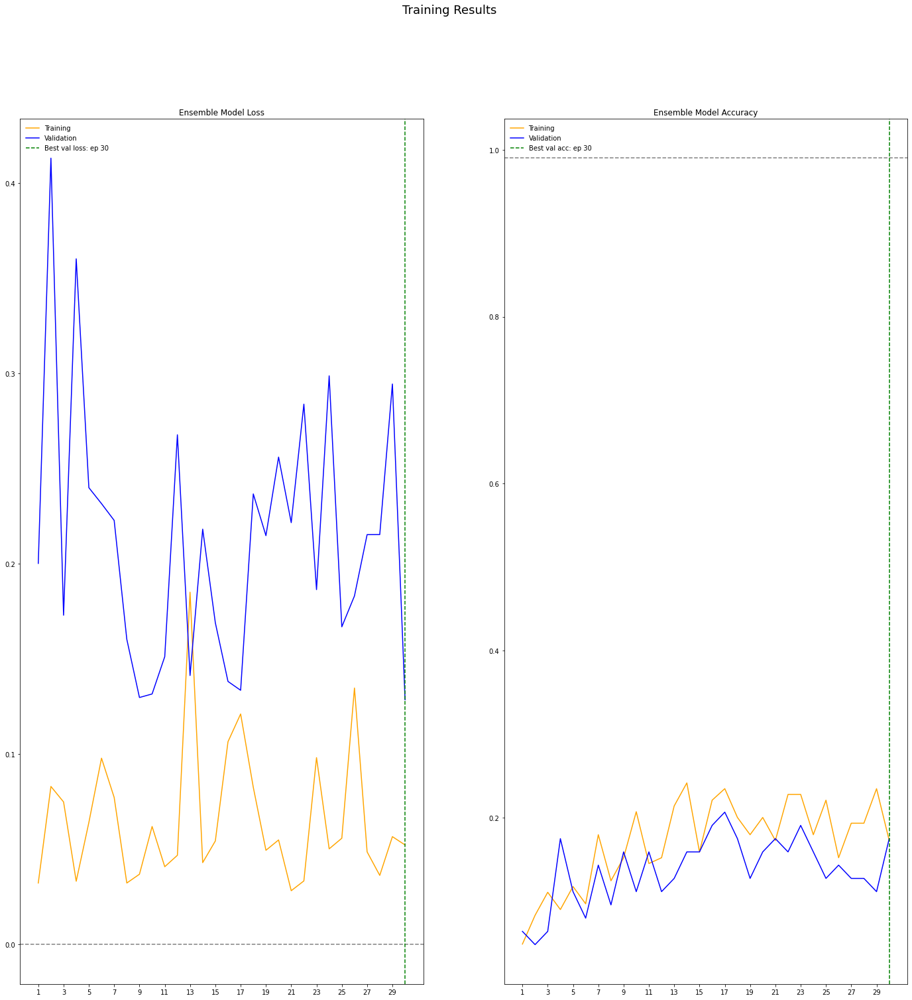

In [ ]:
plot_results([ensemble_model],rows=1,cols=2)

# TL;DR
Note: All information about the architectural results is taken from the official competition website https://paperswithcode.com/sota/image-classification-on-imagenet

## work process:
---
* Before I started working in a notebook I made sure that the GPU is indeed available because in this work there will be a lot of training of heavy models (with many parameters for training).
1. After a short research on the internet I discovered the face detector with the help of which I recognize the face from the whole picture (there are body images in sata and therefore a specific identification of the face is needed). [Quick view](#Face-Detector) 
2. I uploaded all the pictures from the Drive - as I did in the previous exercise for this exercise
3. I used the load data function to split train, valid- as I created it in the exercise before this exercise. [Quick view](#LoadData) 
4. I created a dataset class with a small difference from the previous exercise - integrating face detector in the get item function. [Quick view](#dataset) 
5. I performed transforms as I did in the previous exercise - in the previous exercise there is a detailed report on why I used these augmentations and the selection of the parameters. [Quick view](#transforms) 
6. I created VGG16 architecture - [Quick view](#VGG16) 
7. I created a `model class` as the same wrapper for all the models that will be created, so I will have more leeway with model's parameters. [Quick view](#modelClass) 
8. [on trainAPI](#trainAPI) you can see the training and evaluation function which is adapted to the validation group.
9. I chose 5 more architectures from the torchvision library and also trained them- 
  + ResNet50
  + FPN (ResNet101)
  + MobileNetV3
  + EfficientNetB6
  + VisionTransformer  
  
 I chose these architectures because they are in the leaderboard of the imageNet competition, and indeed received very good scores.

10. I presented the graphs for each model train - accuracy and loss and it was noticeable that the results were not very good. [Quick view](#graphs) 

11. In order to present statistics - for each model I presented a confusion matrix, Roc which confirmed to me that the models do not bring particularly good results. [Quick view](#statistics)

12. So I created an ensemble model- the only model I did not choose is VGG16 (of the other models this model brought the least results), so I combined the other five under one model and trained it as well. 
  + At the end of the training I presented his results and indeed the results were better. [Quick view](#ensembleGraphs)
---
## Faults and problems during work (Errors):
  1. `RuntimeError: CUDA error: device-side assert triggered
CUDA kernel errors might be asynchronously reported at some other API call,so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.`  
    1.1. solution: define `os.environ['CUDA_LAUNCH_BLOCKING'] = "1"` **before** imporing torch- for better debugging
  2. `mat1 and mat2 shapes cannot be multiplied (16x5000 and 1x13)` on classifier stage with ensemble_model  
    2.1. I did print `x.shape` to see what will enter to classifier (Linear layer) and update the dimensions according to x's shape
  3. `Cuda Out Of Memory` - During model training ,the GPU runs out of memory
    3.1. after each model trainning I added: 

          model = model.to(cpu) 
          gc.collect()
          torch.cuda.empty_cache()
          
  4. `Cannot connect to GPU backend -
You cannot currently connect to a GPU due to usage limits in Colab.`  
    4.1. Temporary but working solution - I opened another email account and ran the notebook there. Further research is needed on the subject - to understand when this restriction will come down from my account. 
    + This limitation jumped because the work on the notebook was very lengthy.
  5. To convert this notebook (14.7 MB)- https://stackoverflow.com/questions/53460051/convert-ipynb-notebook-to-html-in-google-colab

In [ ]:
print("""
                       \\WWW/
                       /   \\    <Bye>
                      /wwwww\\
                    _|  o_o  |_
       \\WWWWWWW/   (_   / \\   _)
     _.'` o_o `'._   |  \\_/  |
    (_    (_)    _)  : ~~~~~ :
      '.'-...-'.'     \\_____/
       (`'---'`)      [     ]
        `\"\"\"\"\"`       `\"\"\"\"\"`
               Bert & Ernie
""")


                       \WWW/
                       /   \    <Bye>
                      /wwwww\
                    _|  o_o  |_
       \WWWWWWW/   (_   / \   _)
     _.'` o_o `'._   |  \_/  |
    (_    (_)    _)  : ~~~~~ :
      '.'-...-'.'     \_____/
       (`'---'`)      [     ]
        `"""""`       `"""""`
               Bert & Ernie



In [ ]:
%%shell
jupyter nbconvert --to html '/content/Task_03_(2).ipynb'

[NbConvertApp] Converting notebook /content/Task_03_(2).ipynb to html
[NbConvertApp] Writing 15813696 bytes to /content/Task_03_(2).html
